In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('simulated_sensor_data_50k.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 0.3  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
M = 10  # Number of nodes to poll

# Initialize state vector (value and rate of change) and covariance for each node at the node-side
x_hat_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}
P_node = {f'mote{i}': np.eye(2) for i in range(1, num_nodes + 1)}  # Covariance matrix for each node at the node-side

# Initialize state vector (value and rate of change) for each node at the sink-side
x_hat_sink = {f'mote{i}': np.array([20.0, 1]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the time spent after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track time since threshold exceeded

# Kalman filter matrices for the node-side
A_node = np.array([[1, 1],  # State transition matrix
                   [0, 1]])
Q_node = np.array([[0.01, 0],  # Process noise covariance matrix
                   [0, 0.01]])
H_node = np.array([[1, 0]])  # Observation matrix (only observing the value)
R = np.array([[0.4]])  # Measurement noise covariance matrix


# Kalman filter function for nodes
def kalman_node(measured_value, x_hat, P):
    # Prediction step (predict value and rate of change)
    xp = A_node @ x_hat
    Pp = A_node @ P @ A_node.T + Q_node
    
    # Update step (if the node is polled)
    K = Pp @ H_node.T @ np.linalg.inv(H_node @ Pp @ H_node.T + R)
    x_hat = xp + K @ (measured_value - H_node @ xp)
    P = Pp - K @ H_node @ Pp
    return x_hat, P

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(x_hat, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = x_hat[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, x_hat_node, x_hat_sink, P_node, actual_values, predicted_values, M, penalty, transmission_threshold):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_time  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(x_hat_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(x_hat_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        
        whittle_arms[mote] = q_passive - q_active

        # If the Whittle index is greater than zero, start tracking AoII time
        # If the Whittle index is greater than zero, start tracking AoII time
        if whittle_arms[mote] > 0:
            # Start tracking the time from when the threshold is exceeded
            aoii_time_tracker[mote] += 1
            print(f"Node {mote} exceeded the threshold, AoII time incremented to {aoii_time_tracker[mote]} at time {current_time_step}.")
        else:
            print(f"Node {mote} did not exceed the threshold at time {current_time_step}.")
    # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] > 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        
        # Once polled, get the true measurement from the node
        measured_value = pivot_df.loc[current_time, column_name]

        # Node performs Kalman filtering to update its state
        x_hat_node[column_name], P_node[column_name] = kalman_node(measured_value, x_hat_node[column_name], P_node[column_name])

        # Node sends its current state and rate of change to the sink
        x_hat_sink[column_name] = x_hat_node[column_name]  # Only update sink state when node is polled

        # Update the last polling time
        last_update_times[mote] = current_time

        # Reset AoII time for this node (since it has been polled)
        aoii_time_tracker[mote] = 0

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(x_hat_sink[column_name][0])  # Store the predicted value

        # Increment polling counter
        polling_counter[mote] += 1

    return x_hat_node, x_hat_sink, P_node, actual_values, predicted_values

# Initialize actual and predicted value storage
actual_values = {i: [] for i in range(1, num_nodes + 1)}
predicted_values = {i: [] for i in range(1, num_nodes + 1)}

# Simulation settings
num_steps = len(pivot_df)  # Number of time steps in the dataset

# Run the simulation
for t in range(num_steps):
    # For each time step, every node updates its state using Kalman filter with new measurements
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[t, column_name]
        x_hat_node[column_name], P_node[column_name] = kalman_node(measured_value, x_hat_node[column_name], P_node[column_name])

    # Poll nodes based on Whittle index and AoII
    x_hat_node, x_hat_sink, P_node, actual_values, predicted_values = poll_nodes_whittle(
        pivot_df, t, x_hat_node, x_hat_sink, P_node, actual_values, predicted_values, M, penalty, transmission_threshold
    )

# Calculate the average AoII across all nodes that exceeded the threshold
non_zero_aoii_times = [age for age in aoii_time_tracker.values() if age > 0]

if non_zero_aoii_times:  # Check if there are non-zero AoII times
    average_aoii_time = np.mean(non_zero_aoii_times)
    print(f"Average AoII time after threshold exceeded: {average_aoii_time:.2f}")
else:
    print("No AoII time exceeded the threshold.")



Node 1 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 2 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 3 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 4 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 5 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 6 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 7 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 8 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 9 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 10 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 11 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 12 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 13 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 14 exceeded the threshold, AoII time incremented to 1 at time 0.
Node 15 exceeded the threshol

In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('simulated_sensor_data_50k.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 0.5  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
M = 15 # Number of nodes to poll

# Initialize state vector (value and rate of change) and covariance for each node at the node-side
x_hat_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}
P_node = {f'mote{i}': np.eye(2) for i in range(1, num_nodes + 1)}  # Covariance matrix for each node at the node-side

# Initialize state vector (value and rate of change) for each node at the sink-side
x_hat_sink = {f'mote{i}': np.array([20.0, 1]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the total AoII accumulated after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track the total AoII time since threshold exceeded
aoii_exceeded_tracker = {i: False for i in range(1, num_nodes + 1)}  # Track if threshold was exceeded for each node

# Kalman filter matrices for the node-side
A_node = np.array([[1, 1],  # State transition matrix
                   [0, 1]])
Q_node = np.array([[0.01, 0],  # Process noise covariance matrix
                   [0, 0.01]])
H_node = np.array([[1, 0]])  # Observation matrix (only observing the value)
R = np.array([[0.1]])  # Measurement noise covariance matrix

# Kalman filter function for nodes
def kalman_node(measured_value, x_hat, P):
    # Prediction step (predict value and rate of change)
    xp = A_node @ x_hat
    Pp = A_node @ P @ A_node.T + Q_node
    
    # Update step (if the node is polled)
    K = Pp @ H_node.T @ np.linalg.inv(H_node @ Pp @ H_node.T + R)
    x_hat = xp + K @ (measured_value - H_node @ xp)
    P = Pp - K @ H_node @ Pp
    return x_hat, P

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(x_hat, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = x_hat[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, x_hat_node, x_hat_sink, P_node, actual_values, predicted_values, M, penalty, transmission_threshold):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_time  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(x_hat_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(x_hat_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        
        whittle_arms[mote] = q_passive - q_active

        # If the Whittle index is greater than zero, start tracking AoII time
        if whittle_arms[mote] > 0 :
            #aoii_exceeded_tracker[mote] = True  # Mark that the threshold has been exceeded
            aoii_time_tracker[mote] += 1

    # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] > 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        
        # Once polled, get the true measurement from the node
        measured_value = pivot_df.loc[current_time, column_name]

        # Node performs Kalman filtering to update its state
        x_hat_node[column_name], P_node[column_name] = kalman_node(measured_value, x_hat_node[column_name], P_node[column_name])

        # Node sends its current state and rate of change to the sink
        x_hat_sink[column_name] = x_hat_node[column_name]  # Only update sink state when node is polled

        # Update the last polling time
        last_update_times[mote] = current_time

        # The AoII time tracker should **not reset** here. Accumulate the total AoII time.
        #if aoii_exceeded_tracker[mote]:
         #   aoii_time_tracker[mote] += 1  # Accumulate the AoII time

        # Reset the tracker for future calculations
        #aoii_exceeded_tracker[mote] = False

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(x_hat_sink[column_name][0])  # Store the predicted value

        # Increment polling counter
        polling_counter[mote] += 1

    return x_hat_node, x_hat_sink, P_node, actual_values, predicted_values

# Initialize actual and predicted value storage
actual_values = {i: [] for i in range(1, num_nodes + 1)}
predicted_values = {i: [] for i in range(1, num_nodes + 1)}

# Simulation settings
num_steps = len(pivot_df)  # Number of time steps in the dataset

# Run the simulation
for t in range(num_steps):
    # For each time step, every node updates its state using Kalman filter with new measurements
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[t, column_name]
        x_hat_node[column_name], P_node[column_name] = kalman_node(measured_value, x_hat_node[column_name], P_node[column_name])

    # Poll nodes based on Whittle index and AoII
    x_hat_node, x_hat_sink, P_node, actual_values, predicted_values = poll_nodes_whittle(
        pivot_df, t, x_hat_node, x_hat_sink, P_node, actual_values, predicted_values, M, penalty, transmission_threshold
    )

# Calculate the average AoII across all nodes that exceeded the threshold
non_zero_aoii_times = [age for age in aoii_time_tracker.values() if age > 0]

if non_zero_aoii_times:  # Check if there are non-zero AoII times
    average_aoii_time = np.mean(non_zero_aoii_times)
    print(f"Average AoII time after threshold exceeded: {average_aoii_time:.2f}")
else:
    print("No AoII time exceeded the threshold.")


Average AoII time after threshold exceeded: 28.08


In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
#pivot_df = pd.read_csv('simulated_sensor_data_50k.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 0.5  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
M = 10  # Number of nodes to poll

# Initialize state vector (value and rate of change) and covariance for each node at the node-side
x_hat_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}
P_node = {f'mote{i}': np.eye(2) for i in range(1, num_nodes + 1)}  # Covariance matrix for each node at the node-side

# Initialize state vector (value and rate of change) for each node at the sink-side
x_hat_sink = {f'mote{i}': np.array([20.0, 1]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the total AoII accumulated after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track the total AoII time since threshold exceeded
aoii_exceeded_tracker = {i: False for i in range(1, num_nodes + 1)}  # Track if threshold was exceeded for each node

# Kalman filter matrices for the node-side
A_node = np.array([[1, 1],  # State transition matrix
                   [0, 1]])
Q_node = np.array([[0.01, 0],  # Process noise covariance matrix
                   [0, 0.01]])
H_node = np.array([[1, 0]])  # Observation matrix (only observing the value)
R = np.array([[0.1]])  # Measurement noise covariance matrix

# Kalman filter function for nodes
def kalman_node(measured_value, x_hat, P):
    # Prediction step (predict value and rate of change)
    xp = A_node @ x_hat
    Pp = A_node @ P @ A_node.T + Q_node
    
    # Update step (if the node is polled)
    K = Pp @ H_node.T @ np.linalg.inv(H_node @ Pp @ H_node.T + R)
    x_hat = xp + K @ (measured_value - H_node @ xp)
    P = Pp - K @ H_node @ Pp
    return x_hat, P

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(x_hat, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = x_hat[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, x_hat_node, x_hat_sink, P_node, actual_values, predicted_values, M, penalty, transmission_threshold):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_time  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(x_hat_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(x_hat_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        
        whittle_arms[mote] = q_passive - q_active

    # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] > 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    # Increment AoII time for nodes that are not polled but have Whittle index > 0
    for mote in whittle_arms:
        if whittle_arms[mote] > 0 and mote not in nodes_to_poll:
            # Increment AoII time since threshold is exceeded but the node is not polled
            aoii_time_tracker[mote] += 1

    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        
        # Once polled, get the true measurement from the node
        measured_value = pivot_df.loc[current_time, column_name]

        # Node performs Kalman filtering to update its state
        x_hat_node[column_name], P_node[column_name] = kalman_node(measured_value, x_hat_node[column_name], P_node[column_name])

        # Node sends its current state and rate of change to the sink
        x_hat_sink[column_name] = x_hat_node[column_name]  # Only update sink state when node is polled

        # Update the last polling time
        last_update_times[mote] = current_time

        # Do not reset the AoII tracker since we are accumulating the time when not polled
        aoii_exceeded_tracker[mote] = False

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(x_hat_sink[column_name][0])  # Store the predicted value

        # Increment polling counter
        polling_counter[mote] += 1

    return x_hat_node, x_hat_sink, P_node, actual_values, predicted_values

# Initialize actual and predicted value storage
actual_values = {i: [] for i in range(1, num_nodes + 1)}
predicted_values = {i: [] for i in range(1, num_nodes + 1)}

# Simulation settings
num_steps = len(pivot_df)  # Number of time steps in the dataset

# Run the simulation
for t in range(num_steps):
    # For each time step, every node updates its state using Kalman filter with new measurements
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[t, column_name]
        x_hat_node[column_name], P_node[column_name] = kalman_node(measured_value, x_hat_node[column_name], P_node[column_name])

    # Poll nodes based on Whittle index and AoII
    x_hat_node, x_hat_sink, P_node, actual_values, predicted_values = poll_nodes_whittle(
        pivot_df, t, x_hat_node, x_hat_sink, P_node, actual_values, predicted_values, M, penalty, transmission_threshold
    )

# Calculate the average AoII across all nodes that exceeded the threshold
non_zero_aoii_times = [age for age in aoii_time_tracker.values() if age > 0]

if non_zero_aoii_times:  # Check if there are non-zero AoII times
    average_aoii_time = np.mean(non_zero_aoii_times)
    print(f"Average AoII time after threshold exceeded: {average_aoii_time:.2f}")
else:
    print("No AoII time exceeded the threshold.")


Average AoII time after threshold exceeded: 5.39


In [151]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
#pivot_df = pd.read_csv('simulated_sensor_data_50k.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)


# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 10  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
M = 1  # Number of nodes to poll (equals the total number of nodes)
beta_1 = 0.2 # dEWMA parameter for state value
beta_2 = 0.2  # dEWMA parameter for rate of change

# Initialize state vector (value and rate of change) for each node at the node-side using dEWMA
state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}  # State value, Rate of change

# Initialize state vector (value and rate of change) for each node at the sink-side
state_sink = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the time spent after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track time since threshold exceeded
aoii_exceeded_tracker = {i: False for i in range(1, num_nodes + 1)}  # Track if AoII threshold is exceeded

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = state[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, state_node, state_sink, actual_values, predicted_values, M, penalty):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time
    nodes_to_poll = []  # Initialize nodes_to_poll

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_time  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        
        whittle_arms[mote] = q_passive - q_active

        # If the Whittle index is greater than zero and the node is not polled, start tracking AoII time
  

    # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] > 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]


    for mote in whittle_arms:
        if whittle_arms[mote] > 0 and mote not in nodes_to_poll:
            # Increment AoII time since threshold is exceeded but the node is not polled
            aoii_time_tracker[mote] += 1


    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        
        # Once polled, get the true measurement from the node
        measured_value = pivot_df.loc[current_time, column_name]

        # Update the state using dEWMA filtering
        last_state_value, last_rate_of_change = state_node[column_name]
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

        # Update the sink's state based on the node's transmitted state
        state_sink[column_name] = state_node[column_name]

        # Update the last polling time
        last_update_times[mote] = current_time

        # Mark that the node has been polled
        aoii_exceeded_tracker[mote] = False  # The node has been polled, so we reset the exceeded tracker
        polling_counter[mote] += 1

        

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(state_sink[column_name][0])  # Store the predicted value (state)

    return state_node, state_sink, actual_values, predicted_values

# Initialize actual and predicted value storage
actual_values = {i: [] for i in range(1, num_nodes + 1)}
predicted_values = {i: [] for i in range(1, num_nodes + 1)}

# Simulation settings
num_steps = len(pivot_df)  # Number of time steps in the dataset

# Run the simulation
for t in range(num_steps):
    # For each time step, every node updates its state using dEWMA filter with new measurements
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[t, column_name]
        last_state_value, last_rate_of_change = state_node[column_name]
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

    # Poll nodes based on Whittle index and AoII
    state_node, state_sink, actual_values, predicted_values = poll_nodes_whittle(
        pivot_df, t, state_node, state_sink, actual_values, predicted_values, M, penalty
    )

# Calculate the average AoII across all nodes that exceeded the threshold
non_zero_aoii_times = [age for age in aoii_time_tracker.values() if age > 0]

if non_zero_aoii_times:  # Check if there are non-zero AoII times
    average_aoii_time = np.mean(non_zero_aoii_times)
    print(f"Average AoII time after threshold exceeded: {average_aoii_time:.2f}")
else:
    print("No AoII time exceeded the threshold.")




Average AoII time after threshold exceeded: 25.14


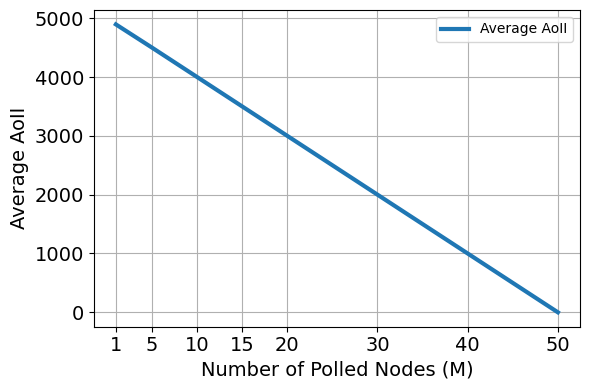

In [194]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 0 # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
beta_1 = 0.5  # dEWMA parameter for state value
beta_2 = 0.5  # dEWMA parameter for rate of change
num_nodes_to_poll_list = [1,5,10, 15, 20, 30, 40,50]  # List of different M values

# Initialize state vector (value and rate of change) for each node at the node-side using dEWMA
state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}  # State value, Rate of change

# Initialize state vector (value and rate of change) for each node at the sink-side
state_sink = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the time spent after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track time since threshold exceeded
aoii_exceeded_tracker = {i: False for i in range(1, num_nodes + 1)}  # Track if AoII threshold is exceeded

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = state[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, state_node, state_sink, actual_values, predicted_values, M, penalty):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time
    nodes_to_poll = []  # Initialize nodes_to_poll

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_times[mote]  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        
        whittle_arms[mote] = q_passive - q_active



        # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] > 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]


    for mote in whittle_arms:
        if whittle_arms[mote] > 0 and mote not in nodes_to_poll:
            # Increment AoII time since threshold is exceeded but the node is not polled
            aoii_time_tracker[mote] += 1

 

    # Polling and update state
    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        
        # Once polled, get the true measurement from the node
        measured_value = pivot_df.loc[current_time, column_name]

        # Update the state using dEWMA filtering
        last_state_value, last_rate_of_change = state_node[column_name]
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

        # Update the sink's state based on the node's transmitted state
        state_sink[column_name] = state_node[column_name]

        # Update the last polling time
        last_update_times[mote] = current_time

        # Mark that the node has been polled
        aoii_exceeded_tracker[mote] = False  # The node has been polled, so we reset the exceeded tracker
        polling_counter[mote] += 1

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(state_sink[column_name][0])  # Store the predicted value (state)

    return state_node, state_sink, actual_values, predicted_values

# Function to run the simulation for different values of M
def run_simulation_for_different_M(num_nodes_to_poll_list):
    average_aoii_results = []

    for M in num_nodes_to_poll_list:
        # Reinitialize trackers and states
        global aoii_time_tracker, state_node, state_sink
        aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Reset AoII time tracker
        state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}
        state_sink = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}

        # Initialize actual and predicted value storage
        actual_values = {i: [] for i in range(1, num_nodes + 1)}
        predicted_values = {i: [] for i in range(1, num_nodes + 1)}

        # Run the simulation
        for t in range(num_steps):
            # For each time step, every node updates its state using dEWMA filter with new measurements
            for mote in range(1, num_nodes + 1):
                column_name = f'mote{mote}'
                measured_value = pivot_df.loc[t, column_name]
                last_state_value, last_rate_of_change = state_node[column_name]
                state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

            # Poll nodes based on Whittle index and AoII
            state_node, state_sink, actual_values, predicted_values = poll_nodes_whittle(
                pivot_df, t, state_node, state_sink, actual_values, predicted_values, M, penalty
            )

        # Calculate the average AoII across all nodes that exceeded the threshold
        non_zero_aoii_times = [age for age in aoii_time_tracker.values() if age > 0]
        if non_zero_aoii_times:
            average_aoii_time = np.mean(non_zero_aoii_times)
        else:
            average_aoii_time = 0.0

        average_aoii_results.append(average_aoii_time)

    return average_aoii_results

# Run simulation for different M values
average_aoii_results = run_simulation_for_different_M(num_nodes_to_poll_list)

# Plot the results
plt.figure(figsize=(6, 4))
plt.plot(num_nodes_to_poll_list, average_aoii_results, label='Average AoII', linewidth=3)

# Customize x and y labels with plain font settings
plt.xlabel('Number of Polled Nodes (M)', fontsize=14)
plt.ylabel('Average AoII', fontsize=14)

# Set x-ticks to be the same as the integer values from num_nodes_to_poll_list
plt.xticks(ticks=num_nodes_to_poll_list, labels=num_nodes_to_poll_list, fontsize=14)

# Customize y-ticks
plt.yticks(fontsize=14)

# Display legend
plt.legend()

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()


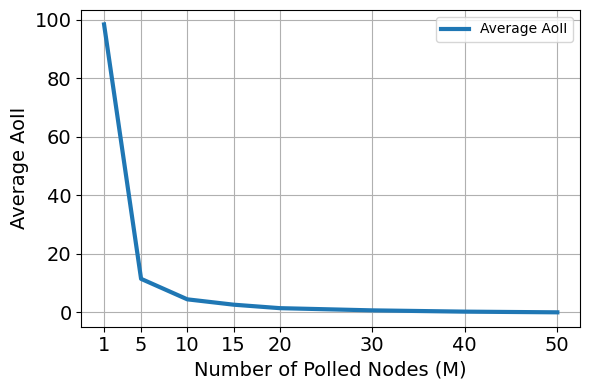

In [195]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 0  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
beta_1 = 0.5  # dEWMA parameter for state value
beta_2 = 0.5  # dEWMA parameter for rate of change
num_nodes_to_poll_list = [1, 5, 10, 15, 20, 30, 40, 50]  # List of different M values

# Initialize state vector (value and rate of change) for each node at the node-side using dEWMA
state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}  # State value, Rate of change

# Initialize state vector (value and rate of change) for each node at the sink-side
state_sink = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the time spent after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track time since threshold exceeded
aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Store AoII values for each node

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = state[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, state_node, state_sink, actual_values, predicted_values, M, penalty):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time
    nodes_to_poll = []  # Initialize nodes_to_poll

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_times[mote]  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        
        whittle_arms[mote] = q_passive - q_active

    # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] > 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    # Track AoII for nodes not polled and reset AoII for polled nodes
    for mote in range(1, num_nodes + 1):
        if mote not in nodes_to_poll:
            # Increment AoII time since threshold is exceeded but the node is not polled
            aoii_time_tracker[mote] += 1
        else:
            # Store the current AoII in history and reset tracker
            aoii_history[mote].append(aoii_time_tracker[mote])
            aoii_time_tracker[mote] = 0  # Reset AoII tracker after node is polled

    # Polling and update state
    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        
        # Once polled, get the true measurement from the node
        measured_value = pivot_df.loc[current_time, column_name]

        # Update the state using dEWMA filtering
        last_state_value, last_rate_of_change = state_node[column_name]
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

        # Update the sink's state based on the node's transmitted state
        state_sink[column_name] = state_node[column_name]

        # Update the last polling time
        last_update_times[mote] = current_time

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(state_sink[column_name][0])  # Store the predicted value (state)

    return state_node, state_sink, actual_values, predicted_values

# Function to run the simulation for different values of M
def run_simulation_for_different_M(num_nodes_to_poll_list):
    average_aoii_results = []

    for M in num_nodes_to_poll_list:
        # Reinitialize trackers and states
        global aoii_time_tracker, state_node, state_sink, aoii_history
        aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Reset AoII time tracker
        aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Reset AoII history
        state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}
        state_sink = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}

        # Initialize actual and predicted value storage
        actual_values = {i: [] for i in range(1, num_nodes + 1)}
        predicted_values = {i: [] for i in range(1, num_nodes + 1)}

        # Run the simulation
        for t in range(len(pivot_df)):
            # For each time step, every node updates its state using dEWMA filter with new measurements
            for mote in range(1, num_nodes + 1):
                column_name = f'mote{mote}'
                measured_value = pivot_df.loc[t, column_name]
                last_state_value, last_rate_of_change = state_node[column_name]
                state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

            # Poll nodes based on Whittle index and AoII
            state_node, state_sink, actual_values, predicted_values = poll_nodes_whittle(
                pivot_df, t, state_node, state_sink, actual_values, predicted_values, M, penalty
            )

        # Calculate the average AoII across all nodes
        aoii_times = [np.mean(history) for history in aoii_history.values() if history]  # Exclude empty histories
        average_aoii_time = np.mean(aoii_times) if aoii_times else 0.0
        average_aoii_results.append(average_aoii_time)

    return average_aoii_results

# Run simulation for different M values
average_aoii_results = run_simulation_for_different_M(num_nodes_to_poll_list)

# Plot the results
plt.figure(figsize=(6, 4))
plt.plot(num_nodes_to_poll_list, average_aoii_results, label='Average AoII', linewidth=3)

# Customize x and y labels with plain font settings
plt.xlabel('Number of Polled Nodes (M)', fontsize=14)
plt.ylabel('Average AoII', fontsize=14)

# Set x-ticks to be the same as the integer values from num_nodes_to_poll_list
plt.xticks(ticks=num_nodes_to_poll_list, labels=num_nodes_to_poll_list, fontsize=14)

# Customize y-ticks
plt.yticks(fontsize=14)

# Display legend
plt.legend()

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()


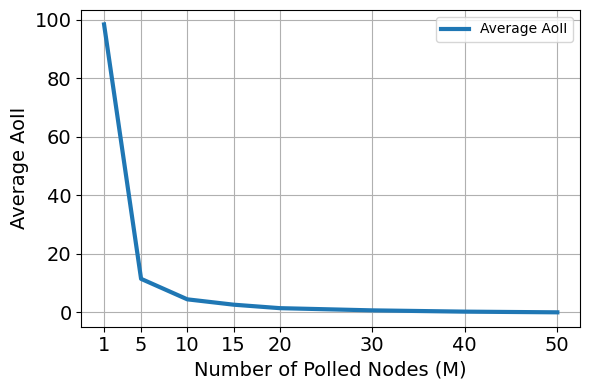

In [200]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 0  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
beta_1 = 0.5  # dEWMA parameter for state value
beta_2 = 0.5  # dEWMA parameter for rate of change
num_nodes_to_poll_list = [1, 5, 10, 15, 20, 30, 40, 50]  # List of different M values

# Initialize state vector (value and rate of change) for each node at the node-side using dEWMA
state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}  # State value, Rate of change

# Initialize state vector (value and rate of change) for each node at the sink-side
state_sink = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the time spent after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track time since threshold exceeded
aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Store AoII values for each node

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = state[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, state_node, state_sink, actual_values, predicted_values, M, penalty):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time
    nodes_to_poll = []  # Initialize nodes_to_poll

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_times[mote]  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        
        whittle_arms[mote] = q_passive - q_active

    # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] > 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    # Increment AoII and reset only if threshold is exceeded
    for mote in range(1, num_nodes + 1):
        
            # Only increment if threshold has been exceeded
        if whittle_arms[mote] > 0:
            

            if mote not in nodes_to_poll:
                aoii_time_tracker[mote] += 1
            #else:
            # Store the current AoII in history and reset tracker for polled nodes
                #aoii_history[mote].append(aoii_time_tracker[mote])
           # Reset AoII tracker after node is polled
           

    # Polling and update state
    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        
        # Once polled, get the true measurement from the node
        measured_value = pivot_df.loc[current_time, column_name]

        # Update the state using dEWMA filtering
        last_state_value, last_rate_of_change = state_node[column_name]
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

        # Update the sink's state based on the node's transmitted state
        state_sink[column_name] = state_node[column_name]

        # Update the last polling time
        last_update_times[mote] = current_time

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(state_sink[column_name][0])  # Store the predicted value (state)
        aoii_history[mote].append(aoii_time_tracker[mote])
        aoii_time_tracker[mote] = 0  

    

    return state_node, state_sink, actual_values, predicted_values

# Function to run the simulation for different values of M
def run_simulation_for_different_M(num_nodes_to_poll_list):
    average_aoii_results = []

    for M in num_nodes_to_poll_list:
        # Reinitialize trackers and states
        global aoii_time_tracker, state_node, state_sink, aoii_history
        aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Reset AoII time tracker
        aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Reset AoII history
        state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}
        state_sink = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}

        # Initialize actual and predicted value storage
        actual_values = {i: [] for i in range(1, num_nodes + 1)}
        predicted_values = {i: [] for i in range(1, num_nodes + 1)}

        # Run the simulation
        for t in range(len(pivot_df)):
            # For each time step, every node updates its state using dEWMA filter with new measurements
            for mote in range(1, num_nodes + 1):
                column_name = f'mote{mote}'
                measured_value = pivot_df.loc[t, column_name]
                last_state_value, last_rate_of_change = state_node[column_name]
                state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

            # Poll nodes based on Whittle index and AoII
            state_node, state_sink, actual_values, predicted_values = poll_nodes_whittle(
                pivot_df, t, state_node, state_sink, actual_values, predicted_values, M, penalty
            )

        # Calculate the average AoII across all nodes
        aoii_times = [np.mean(history) for history in aoii_history.values() if history]  # Exclude empty histories
        average_aoii_time = np.mean(aoii_times) if aoii_times else 0.0
        average_aoii_results.append(average_aoii_time)

    return average_aoii_results

# Run simulation for different M values
average_aoii_results = run_simulation_for_different_M(num_nodes_to_poll_list)

# Plot the results
plt.figure(figsize=(6, 4))
plt.plot(num_nodes_to_poll_list, average_aoii_results, label='Average AoII', linewidth=3)

# Customize x and y labels with plain font settings
plt.xlabel('Number of Polled Nodes (M)', fontsize=14)
plt.ylabel('Average AoII', fontsize=14)

# Set x-ticks to be the same as the integer values from num_nodes_to_poll_list
plt.xticks(ticks=num_nodes_to_poll_list, labels=num_nodes_to_poll_list, fontsize=14)

# Customize y-ticks
plt.yticks(fontsize=14)

# Display legend
plt.legend()

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()


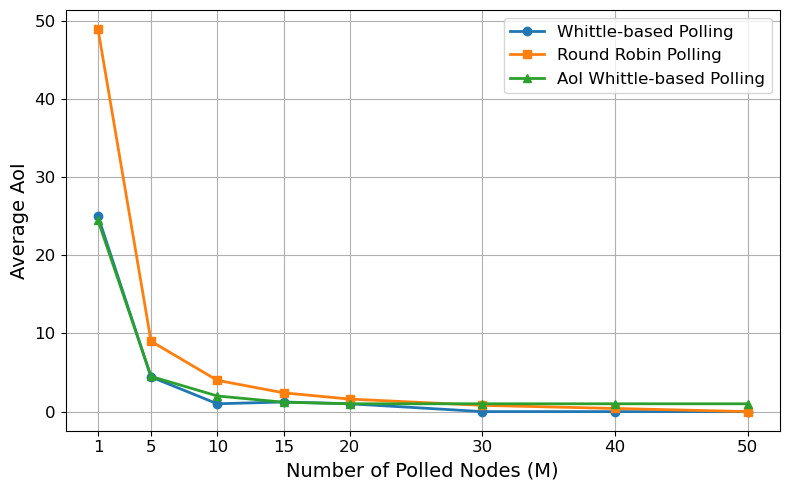

In [181]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
#pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
pivot_df = pd.read_csv('simulated_sensor_data_50k.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(10000)

# Parameters
num_nodes = 50  # Number of nodes
transmission_threshold = 0.3  # Threshold for node transmission
penalty = 5  # Penalty for active action
penalty_aoi = 3
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
beta_1 = 0.99  # dEWMA parameter for state value
beta_2 = 0.99 # dEWMA parameter for rate of change
num_nodes_to_poll_list = [1,5,10, 15, 20, 30, 40,50]  # List of different M values

# Initialize state vector (value and rate of change) for each node at the node-side using dEWMA
state_node = {f'mote{i}': np.array([20.0, 0.01]) for i in range(1, num_nodes + 1)}  # State value, Rate of change

# Initialize state vector (value and rate of change) for each node at the sink-side
state_sink = {f'mote{i}': np.array([20.0, 0.001]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the time spent after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track time since threshold exceeded
aoii_exceeded_tracker = {i: False for i in range(1, num_nodes + 1)}  # Track if AoII threshold is exceeded

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = state[1] * delta_t_dynamic
    return abs(aoii)

# Whittle-based polling function (unchanged)

# Round Robin simulation function
def run_simulation_round_robin(num_nodes_to_poll, delta_t):
    last_update_times = {f'mote{i}': 0 for i in range(1, num_nodes + 1)}
    current_aoi_values = {f'mote{i}': 0 for i in range(1, num_nodes + 1)}
    node_aoi_history = {f'mote{i}': [] for i in range(1, num_nodes + 1)}

    node_poll_index = 0
    nodes = list(current_aoi_values.keys())

    for idx, _ in pivot_df.iterrows():
        current_time_step = idx
        for mote in current_aoi_values:
            current_aoi_values[mote] += delta_t + 1
        nodes_to_poll = []
        for _ in range(num_nodes_to_poll):
            nodes_to_poll.append(nodes[node_poll_index])
            node_poll_index = (node_poll_index + 1) % num_nodes

        for mote in nodes_to_poll:
            current_aoi_values[mote] = 0
            last_update_times[mote] = current_time_step

        for mote in current_aoi_values:
            node_aoi_history[mote].append(current_aoi_values[mote])

    overall_average_aoi = np.mean([np.mean(hist) for hist in node_aoi_history.values()])
    return overall_average_aoi

# Function to update state using dEWMA filtering (unchanged)

def run_simulation_aoi_whittle(num_nodes_to_poll, delta_t, penalty_aoi):
    # Initialize last update times and current AoI values for each node
    last_update_times = {f'mote{i}': 0 for i in range(1, num_nodes + 1)}     # Last update times
    current_aoi_values = {f'mote{i}': 0 for i in range(1, num_nodes + 1)}    # Current AoI values for each node
    node_aoi_history = {f'mote{i}': [] for i in range(1, num_nodes + 1)}     # Store AoI over time for each node

    # Main loop through the dataset
    for idx, _ in pivot_df.iterrows():
        current_time_step = idx

        # Update AoI value for each node
        for mote in current_aoi_values:
            current_aoi_values[mote] += delta_t

        # Select nodes to poll based on Whittle index threshold logic
        nodes_exceeding_threshold = [
            mote for mote, aoi in current_aoi_values.items() if aoi >= penalty_aoi
        ]

        if nodes_exceeding_threshold:
            # If any node exceeds the threshold, select the node with the highest AoI
            nodes_to_poll = sorted(nodes_exceeding_threshold, key=lambda mote: current_aoi_values[mote], reverse=True)[:num_nodes_to_poll]
        else:
            # If no node exceeds the threshold, select no nodes
            nodes_to_poll = []

        # Perform actions for nodes that are being polled
        for mote in nodes_to_poll:
            # Reset AoI for polled nodes
            current_aoi_values[mote] = 0
            last_update_times[mote] = current_time_step

        # Store AoI history for each node
        for mote in current_aoi_values:
            node_aoi_history[mote].append(current_aoi_values[mote])

    # Calculate average AoI for each node over time
    node_average_aoi = {mote: np.mean(node_aoi_history[mote]) for mote in current_aoi_values}
    
    # Calculate overall average AoI across all nodes
    overall_average_aoi = np.mean(list(node_average_aoi.values()))

    return overall_average_aoi




# Function to compare all three strategies: Whittle, Round Robin, and AoI Whittle
def compare_polling_strategies(num_nodes_to_poll_list, delta_t, penalty_aoi):
    average_aoi_whittle = run_simulation_for_different_M(num_nodes_to_poll_list)
    average_aoi_round_robin = [run_simulation_round_robin(M, delta_t) for M in num_nodes_to_poll_list]
    average_aoi_whittle_aoi = [run_simulation_aoi_whittle(M, delta_t, penalty_aoi) for M in num_nodes_to_poll_list]

    return average_aoi_whittle, average_aoi_round_robin, average_aoi_whittle_aoi

# Run and compare all strategies
penalty_aoi = 3  # Penalty threshold for AoI
average_aoi_whittle, average_aoi_round_robin, average_aoi_whittle_aoi = compare_polling_strategies(num_nodes_to_poll_list, delta_t=1, penalty_aoi=penalty_aoi)

# Plot the results for comparison
plt.figure(figsize=(8, 5))
plt.plot(num_nodes_to_poll_list, average_aoi_whittle, label='Whittle-based Polling', marker='o', linewidth=2)
plt.plot(num_nodes_to_poll_list, average_aoi_round_robin, label='Round Robin Polling', marker='s', linewidth=2)
plt.plot(num_nodes_to_poll_list, average_aoi_whittle_aoi, label='AoI Whittle-based Polling', marker='^', linewidth=2)

# Customize plot
plt.xlabel('Number of Polled Nodes (M)', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.xticks(ticks=num_nodes_to_poll_list, labels=num_nodes_to_poll_list, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()




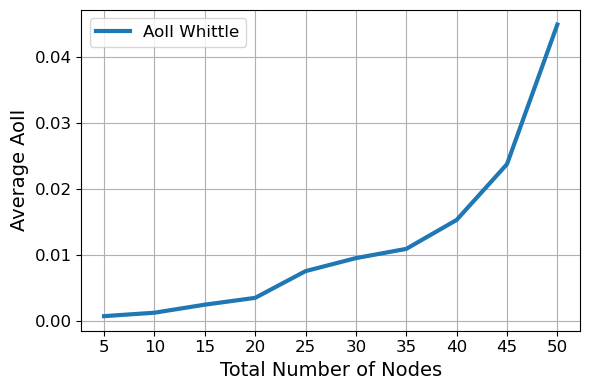

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
#pivot_df = pd.read_csv('fifty_temperatures_motes.csv')
#pivot_df = pd.read_csv('simulated_sensor_data_50k.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
penalty = 0.5  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
beta_1 = 0.3  # dEWMA parameter for state value
beta_2 = 0.1  # dEWMA parameter for rate of change
node_count_list = [5,10, 15,20, 25,30, 35,40,45, 50]  # Only run for these specific numbers of nodes
M = 1  # Fixed number of nodes to poll (M)

# Function to initialize the state of nodes
def initialize_states(num_nodes):
    state_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}  # Node-side state
    state_sink = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}  # Sink-side state
    last_update_times = {i: 0 for i in range(1, num_nodes + 1)}  # Track last update times
    aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track AoII time
    aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Store AoII values
    return state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict AoII from sink
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    return abs(state[1] * delta_t_dynamic)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history, M, penalty, num_nodes):
    whittle_arms = {}  # Store Whittle index
    nodes_to_poll = []  # List of nodes to poll

    # Calculate Whittle index for each node
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        delta_t_dynamic = current_time - last_update_times[mote]  # Time since last update

        # Predict AoII
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)
        future_aoii_passive = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic + 1)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Compute Whittle Index
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        whittle_arms[mote] = q_passive - q_active

    # Select the top M nodes with the highest Whittle index
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] >= 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    # Track AoII for nodes not polled and reset AoII for polled nodes
    for mote in range(1, num_nodes + 1):
        if whittle_arms[mote] >= 0 and mote not in nodes_to_poll:
            aoii_time_tracker[mote] += 1
        else:
            aoii_history[mote].append(aoii_time_tracker[mote])
            aoii_time_tracker[mote] = 0  # Reset AoII after polling

    # Poll the selected nodes and update their state
    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[current_time, column_name]
        last_state_value, last_rate_of_change = state_node[column_name]
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)
        state_sink[column_name] = state_node[column_name]
        last_update_times[mote] = current_time

    return state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history

# Function to run the simulation for specific node counts
def run_simulation_varying_nodes(node_count_list, M):
    average_aoii_results = []

    for num_nodes in node_count_list:
        # Initialize states and trackers
        state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history = initialize_states(num_nodes)

        # Run simulation for the given number of nodes
        for t in range(len(pivot_df)):
            # Update the state for each node using dEWMA before polling
            for mote in range(1, num_nodes + 1):
                column_name = f'mote{mote}'
                measured_value = pivot_df.loc[t, column_name]
                last_state_value, last_rate_of_change = state_node[column_name]
                state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

            # Poll nodes based on Whittle index and AoII after updating states
            state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history = poll_nodes_whittle(
                pivot_df, t, state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history, M, penalty, num_nodes
            )

        # Calculate the average AoII for the nodes
        aoii_times = [np.mean(history) for history in aoii_history.values() if history]
        avg_aoii = np.mean(aoii_times) if aoii_times else 0.0
        average_aoii_results.append(avg_aoii)

    return average_aoii_results


# Run the simulation for the specified number of nodes (e.g., 20, 30, 40, 50) and fixed M = 1
average_aoii_results = run_simulation_varying_nodes(node_count_list, M=1)

# Plot the results
plt.figure(figsize=(6, 4))
plt.plot(node_count_list, average_aoii_results, label='AoII Whittle', linewidth=3)

# Customize plot
plt.xlabel('Total Number of Nodes', fontsize=14)
plt.ylabel('Average AoII', fontsize=14)
plt.xticks(ticks=node_count_list, labels=node_count_list, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()



# Average age of information based on difference in aoii for varying number of nodes

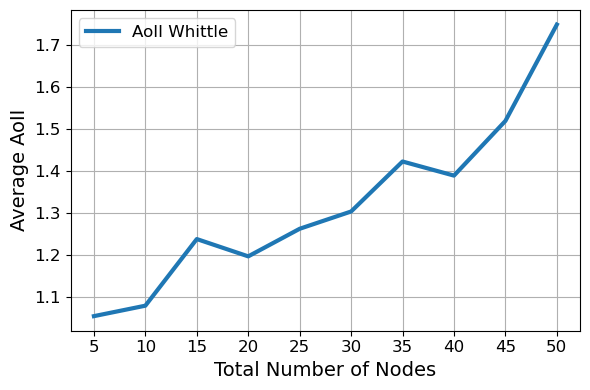

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
#pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
pivot_df = pd.read_csv('fifty_temperatures_motes.csv')
#pivot_df = pd.read_csv('simulated_sensor_data_50k.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
penalty = 1  # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 0.3  # Probability of successful transmission
beta_1 = 0.3  # dEWMA parameter for state value
beta_2 = 0.1  # dEWMA parameter for rate of change
node_count_list = [5,10, 15,20, 25,30, 35,40,45, 50]  # Only run for these specific numbers of nodes
M = 1  # Fixed number of nodes to poll (M)

# Function to initialize the state of nodes
def initialize_states(num_nodes):
    state_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}  # Node-side state
    state_sink = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}  # Sink-side state
    last_update_times = {i: 0 for i in range(1, num_nodes + 1)}  # Track last update times
    aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track AoII time
    aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Store AoII values
    return state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict AoII from sink
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    return abs(state[1] * delta_t_dynamic)

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history, M, penalty, num_nodes):
    whittle_arms = {}  # Store Whittle index
    nodes_to_poll = []  # List of nodes to poll

    # Calculate Whittle index for each node
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        delta_t_dynamic = current_time - last_update_times[mote]  # Time since last update

        # Predict AoII
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)
        future_aoii_passive = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic + 1)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Compute Whittle Index
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty
        whittle_arms[mote] = q_passive - q_active

    # Select the top M nodes with the highest Whittle index
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] >= 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]


    # Poll the selected nodes and update their state
    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[current_time, column_name]
        last_state_value, last_rate_of_change = state_node[column_name]
        delta_t_dynamic = current_time - last_update_times[mote]  # Time since last update

        # Predict AoII
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)
        aoii_history[mote].append(current_aoii)
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)
        state_sink[column_name] = state_node[column_name]
        last_update_times[mote] = current_time

    return state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history

# Function to run the simulation for specific node counts
def run_simulation_varying_nodes(node_count_list, M):
    average_aoii_results = []

    for num_nodes in node_count_list:
        # Initialize states and trackers
        state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history = initialize_states(num_nodes)

        # Run simulation for the given number of nodes
        for t in range(len(pivot_df)):
            # Update the state for each node using dEWMA before polling
            for mote in range(1, num_nodes + 1):
                column_name = f'mote{mote}'
                measured_value = pivot_df.loc[t, column_name]
                last_state_value, last_rate_of_change = state_node[column_name]
                
                state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

            # Poll nodes based on Whittle index and AoII after updating states
            state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history = poll_nodes_whittle(
                pivot_df, t, state_node, state_sink, last_update_times, aoii_time_tracker, aoii_history, M, penalty, num_nodes
            )

        # Calculate the average AoII for the nodes
        aoii_times = [np.mean(history) for history in aoii_history.values() if history]
        avg_aoii = np.mean(aoii_times) if aoii_times else 0.0
        average_aoii_results.append(avg_aoii)

    return average_aoii_results


# Run the simulation for the specified number of nodes (e.g., 20, 30, 40, 50) and fixed M = 1
average_aoii_results = run_simulation_varying_nodes(node_count_list, M=1)

# Plot the results
plt.figure(figsize=(6, 4))
plt.plot(node_count_list, average_aoii_results, label='AoII Whittle', linewidth=3)

# Customize plot
plt.xlabel('Total Number of Nodes', fontsize=14)
plt.ylabel('Average age', fontsize=14)
plt.xticks(ticks=node_count_list, labels=node_count_list, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


#  Age of information whittle index

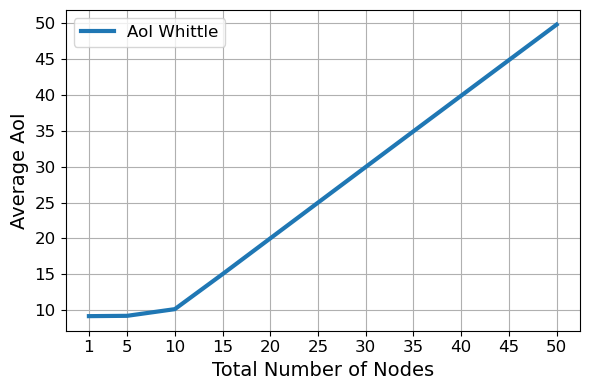

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('fifty_temperatures_motes.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
penalty = 10  # Penalty for active action
pdr = 0.9  # Probability of successful transmission
node_count_list = [1,5,10,15,20,25,30,35,40,45,50]  # Different numbers of nodes
M = 1  # Fixed number of nodes to poll

# Function to initialize the state of nodes and time trackers
def initialize_states(num_nodes):
    state_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}  # Node-side state
    last_update_times = {i: 0 for i in range(1, num_nodes + 1)}  # Track last update times (AoI)
    aoi_history = {i: [] for i in range(1, num_nodes + 1)}  # Store AoI values
    return state_node, last_update_times, aoi_history

# Whittle-based polling function
def poll_nodes_whittle(pivot_df, current_time, state_node, last_update_times, aoi_history, M, penalty, num_nodes):
    whittle_arms = {}  # Store Whittle index
    nodes_to_poll = []  # List of nodes to poll

    # Calculate Whittle index for each node
    for mote in range(1, num_nodes + 1):
        delta_t_dynamic = current_time - last_update_times[mote]  # Time since last update (AoI)

        # Compute Whittle Index (penalty adjusted)
        current_aoi = delta_t_dynamic
        future_aoi_passive = delta_t_dynamic + 1
        future_aoi_active = 0 if np.random.rand() < pdr else future_aoi_passive

        q_passive = current_aoi + future_aoi_passive
        q_active = current_aoi + future_aoi_active + penalty
        whittle_arms[mote] = q_passive - q_active

    # Select the top M nodes with the highest Whittle index
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] >= 0]

    # If we have more nodes than M, select the top M nodes
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    # Poll the selected nodes and update their AoI
    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[current_time, column_name]
        last_state_value, last_rate_of_change = state_node[column_name]
        delta_t_dynamic = current_time - last_update_times[mote]  # Time since last update (AoI)

        # Update AoI (time since last update)
        aoi_history[mote].append(delta_t_dynamic)
        
        # Update state
        state_node[column_name] = np.array([measured_value, last_rate_of_change])  # Dummy update
        last_update_times[mote] = current_time  # Update the last update time

    return state_node, last_update_times, aoi_history

# Function to run the simulation for specific node counts
def run_simulation_varying_nodes(node_count_list, M):
    average_aoi_results = []

    for num_nodes in node_count_list:
        # Initialize states and trackers
        state_node, last_update_times, aoi_history = initialize_states(num_nodes)

        # Run simulation for the given number of nodes
        for t in range(len(pivot_df)):
            # Poll nodes based on Whittle index and AoI after updating states
            state_node, last_update_times, aoi_history = poll_nodes_whittle(
                pivot_df, t, state_node, last_update_times, aoi_history, M, penalty, num_nodes
            )

        # Calculate the average AoI for the nodes
        aoi_times = [np.mean(history) for history in aoi_history.values() if history]
        avg_aoi = np.mean(aoi_times) if aoi_times else 0.0
        average_aoi_results.append(avg_aoi)

    return average_aoi_results

# Run the simulation for the specified number of nodes (e.g., 5, 10, 15, etc.) and fixed M = 1
average_aoi_results = run_simulation_varying_nodes(node_count_list, M=1)

# Plot the results
plt.figure(figsize=(6, 4))
plt.plot(node_count_list, average_aoi_results, label='AoI Whittle', linewidth=3)

# Customize plot
plt.xlabel('Total Number of Nodes', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.xticks(ticks=node_count_list, labels=node_count_list, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


In [33]:
import numpy as np
import pandas as pd

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('fifty_temperatures_motes.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(10000)

# Simulation settings
#np.random.seed(42)  # Seed for reproducibility
num_nodes = 50  # Number of nodes (as requested)
num_time_steps = 10000  # Number of time steps in the simulation

# Transmission success probabilities
low_success_probs = np.full(num_nodes, 0.3)  # Low success probability for all nodes
high_success_probs = np.full(num_nodes, 0.9)  # High success probability for all nodes

# Initialize AoI for both Round Robin and AoI scheduling
def run_simulation_with_real_data(transmission_probs, pivot_df):
    aoi_rr = np.zeros(num_nodes)  # AoI for Round Robin scheduling
    aoi_aoi = np.zeros(num_nodes)  # AoI for AoI-based scheduling
    total_aoi_rr = np.zeros(num_time_steps)  # To store AoI over time
    total_aoi_aoi = np.zeros(num_time_steps)

    # Initialize last update time for both scheduling methods
    last_update_rr = np.zeros(num_nodes)  # Last update time for RR
    last_update_aoi = np.zeros(num_nodes)  # Last update time for AoI-based

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps + 1):
        # Round Robin scheduling
        node_rr = (t - 1) % num_nodes  # Poll nodes in cyclic order
        if transmission_success(transmission_probs[node_rr]):
            last_update_rr[node_rr] = t  # Successful transmission
        aoi_rr = t - last_update_rr  # Update AoI for RR
        total_aoi_rr[t - 1] = np.mean(aoi_rr)  # Store average AoI for RR

        # AoI-based scheduling: Poll node with the highest AoI
        node_aoi = np.argmax(aoi_aoi)  # Select node with the highest AoI
        if transmission_success(transmission_probs[node_aoi]):
            last_update_aoi[node_aoi] = t  # Successful transmission
        aoi_aoi = t - last_update_aoi  # Update AoI for AoI-based scheduling
        total_aoi_aoi[t - 1] = np.mean(aoi_aoi)  # Store average AoI for AoI-based scheduling

    # Return the final average AoI at the last time step
    final_avg_aoi_rr = np.mean(aoi_rr)  # Final average AoI for Round Robin
    final_avg_aoi_aoi = np.mean(aoi_aoi)  # Final average AoI for AoI-based scheduling
    return total_aoi_rr, total_aoi_aoi, final_avg_aoi_rr, final_avg_aoi_aoi

# Run the simulation for low success probability
total_aoi_rr_low, total_aoi_aoi_low, final_avg_aoi_rr_low, final_avg_aoi_aoi_low = run_simulation_with_real_data(low_success_probs, pivot_df)

# Run the simulation for high success probability
total_aoi_rr_high, total_aoi_aoi_high, final_avg_aoi_rr_high, final_avg_aoi_aoi_high = run_simulation_with_real_data(high_success_probs, pivot_df)

# Return final average AoI values for both policies under both success probabilities
{
    "Final Average AoI (Low Success) - Round Robin": final_avg_aoi_rr_low,
    "Final Average AoI (Low Success) - AoI-based": final_avg_aoi_aoi_low,
    "Final Average AoI (High Success) - Round Robin": final_avg_aoi_rr_high,
    "Final Average AoI (High Success) - AoI-based": final_avg_aoi_aoi_high
}


{'Final Average AoI (Low Success) - Round Robin': 127.5,
 'Final Average AoI (Low Success) - AoI-based': 92.38,
 'Final Average AoI (High Success) - Round Robin': 33.5,
 'Final Average AoI (High Success) - AoI-based': 27.7}

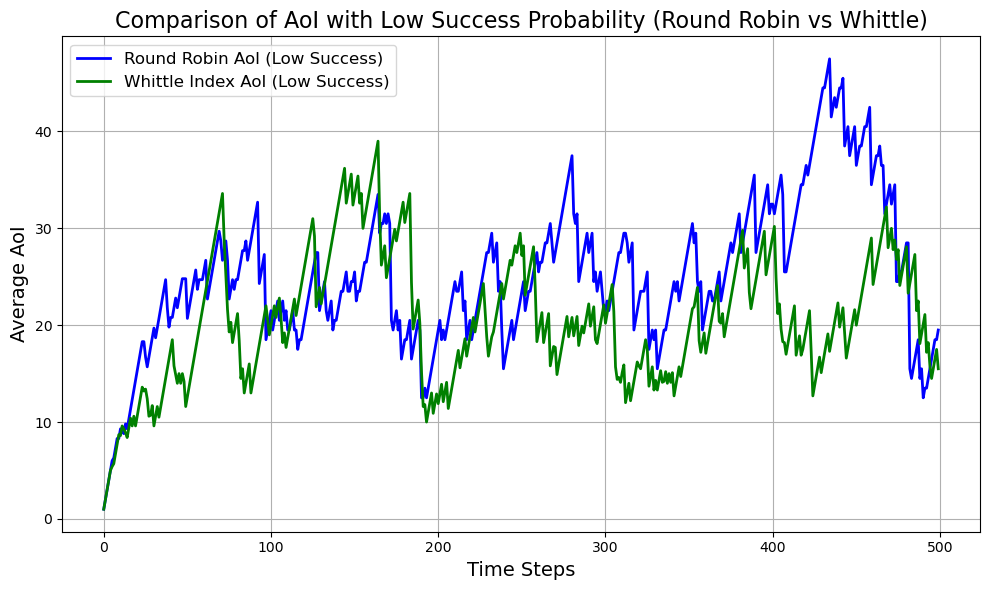

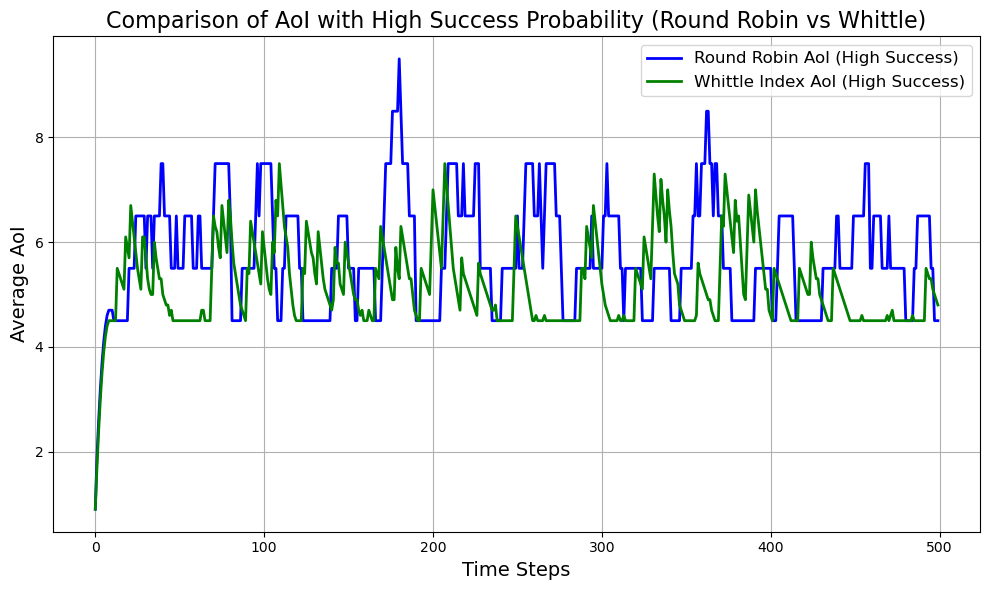

{'Final Average AoI (Low Success) - Round Robin': 19.5,
 'Final Average AoI (Low Success) - Whittle Index': 15.5,
 'Final Average AoI (High Success) - Round Robin': 4.5,
 'Final Average AoI (High Success) - Whittle Index': 4.8}

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Simulation settings
#np.random.seed(42)  # Seed for reproducibility
num_nodes = 10  # Number of nodes
num_time_steps = 500  # Number of time steps in the simulation
penalty = 1  # Penalty for polling

# Transmission success probabilities
low_success_probs = np.full(num_nodes, 0.3)  # Low success probability for all nodes
high_success_probs = np.full(num_nodes, 0.9)  # High success probability for all nodes

# Initialize AoI for both Round Robin, Whittle Index, and AoI scheduling
def run_simulation_with_whittle(transmission_probs):
    aoi_rr = np.zeros(num_nodes)  # AoI for Round Robin scheduling
    aoi_whittle = np.zeros(num_nodes)  # AoI for Whittle index-based scheduling
    total_aoi_rr = np.zeros(num_time_steps)  # To store AoI over time for Round Robin
    total_aoi_whittle = np.zeros(num_time_steps)  # To store AoI over time for Whittle Index

    # Initialize last update time for both scheduling methods
    last_update_rr = np.zeros(num_nodes)  # Last update time for RR
    last_update_whittle = np.zeros(num_nodes)  # Last update time for Whittle index

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps + 1):
        # Round Robin scheduling
        node_rr = (t - 1) % num_nodes  # Poll nodes in cyclic order
        if transmission_success(transmission_probs[node_rr]):
            last_update_rr[node_rr] = t  # Successful transmission
        aoi_rr = t - last_update_rr  # Update AoI for RR
        total_aoi_rr[t - 1] = np.mean(aoi_rr)  # Store average AoI for RR

        # Whittle index-based scheduling: Poll node with the highest Whittle index
        whittle_indices = {}
        for node in range(num_nodes):
            current_aoi = t - last_update_whittle[node]  # Current AoI
            future_aoi_passive = current_aoi + 1  # AoI if we don't poll (passive)
            future_aoi_active = 0 if transmission_success(transmission_probs[node]) else current_aoi  # AoI if we poll (active)
            
            # Whittle index: passive - (active + penalty)
            whittle_indices[node] = future_aoi_passive - (future_aoi_active + penalty)
        
        # Poll nodes with Whittle index > 0
        nodes_to_poll = [node for node, index in whittle_indices.items() if index > 0]
        if nodes_to_poll:
            node_whittle = nodes_to_poll[np.argmax([whittle_indices[node] for node in nodes_to_poll])]  # Choose the one with the highest index
        else:
            node_whittle = np.argmax(aoi_whittle)  # Fallback: highest AoI

        # Update Whittle index-based AoI
        if transmission_success(transmission_probs[node_whittle]):
            last_update_whittle[node_whittle] = t  # Successful transmission
        aoi_whittle = t - last_update_whittle  # Update AoI for Whittle-based scheduling
        total_aoi_whittle[t - 1] = np.mean(aoi_whittle)  # Store average AoI for Whittle-based scheduling

    # Return the final average AoI at the last time step
    final_avg_aoi_rr = np.mean(aoi_rr)  # Final average AoI for Round Robin
    final_avg_aoi_whittle = np.mean(aoi_whittle)  # Final average AoI for Whittle Index
    return total_aoi_rr, total_aoi_whittle, final_avg_aoi_rr, final_avg_aoi_whittle

# Run the simulation for low success probability
total_aoi_rr_low, total_aoi_whittle_low, final_avg_aoi_rr_low, final_avg_aoi_whittle_low = run_simulation_with_whittle(low_success_probs)

# Run the simulation for high success probability
total_aoi_rr_high, total_aoi_whittle_high, final_avg_aoi_rr_high, final_avg_aoi_whittle_high = run_simulation_with_whittle(high_success_probs)

# Plot the results for low success probability
plt.figure(figsize=(10, 6))
plt.plot(total_aoi_rr_low, label='Round Robin AoI (Low Success)', color='blue', linewidth=2)
plt.plot(total_aoi_whittle_low, label='Whittle Index AoI (Low Success)', color='green', linewidth=2)
plt.xlabel('Time Steps', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Comparison of AoI with Low Success Probability (Round Robin vs Whittle)', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the results for high success probability
plt.figure(figsize=(10, 6))
plt.plot(total_aoi_rr_high, label='Round Robin AoI (High Success)', color='blue', linewidth=2)
plt.plot(total_aoi_whittle_high, label='Whittle Index AoI (High Success)', color='green', linewidth=2)
plt.xlabel('Time Steps', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Comparison of AoI with High Success Probability (Round Robin vs Whittle)', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Return final average AoI values for both policies under both success probabilities
{
    "Final Average AoI (Low Success) - Round Robin": final_avg_aoi_rr_low,
    "Final Average AoI (Low Success) - Whittle Index": final_avg_aoi_whittle_low,
    "Final Average AoI (High Success) - Round Robin": final_avg_aoi_rr_high,
    "Final Average AoI (High Success) - Whittle Index": final_avg_aoi_whittle_high
}


In [44]:
import numpy as np
import matplotlib.pyplot as plt

# Simulation settings
#np.random.seed(42)  # Seed for reproducibility
num_nodes = 20  # Number of nodes
num_time_steps = 5000  # Number of time steps in the simulation
penalty = 0  # Penalty for polling

# Transmission success probabilities
low_success_probs = np.full(num_nodes, 0.3)  # Low success probability for all nodes
high_success_probs = np.full(num_nodes, 1.0)  # High success probability for all nodes

# Initialize AoI for both Round Robin, Whittle Index, and AoI scheduling
def run_simulation_with_whittle(transmission_probs):
    aoi_rr = np.zeros(num_nodes)  # AoI for Round Robin scheduling
    aoi_whittle = np.zeros(num_nodes)  # AoI for Whittle index-based scheduling
    total_aoi_rr = np.zeros(num_time_steps)  # To store AoI over time for Round Robin
    total_aoi_whittle = np.zeros(num_time_steps)  # To store AoI over time for Whittle Index

    # Initialize last update time for both scheduling methods
    last_update_rr = np.zeros(num_nodes)  # Last update time for RR
    last_update_whittle = np.zeros(num_nodes)  # Last update time for Whittle index

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps + 1):
        # Round Robin scheduling
        node_rr = (t - 1) % num_nodes  # Poll nodes in cyclic order
        if transmission_success(transmission_probs[node_rr]):
            last_update_rr[node_rr] = t  # Successful transmission
        aoi_rr = t - last_update_rr  # Update AoI for RR
        total_aoi_rr[t - 1] = np.mean(aoi_rr)  # Store average AoI for RR

        # Whittle index-based scheduling: Poll node with the highest Whittle index
        whittle_indices = {}
        for node in range(num_nodes):
            delta_t_dynamic = t - last_update_whittle[node]  # Time since last update (AoI)
            current_aoi = delta_t_dynamic

            # Future AoI if passive (no transmission)
            future_aoi_passive = delta_t_dynamic + 1

            # Future AoI if active (transmission succeeds or fails)
            future_aoi_active = 0 if transmission_success(transmission_probs[node]) else future_aoi_passive

            # Whittle index: (q_passive - q_active)
            q_passive = current_aoi + future_aoi_passive
            q_active = current_aoi + future_aoi_active + penalty
            whittle_indices[node] = q_passive - q_active

        # Poll nodes with Whittle index > 0
        nodes_to_poll = [node for node, index in whittle_indices.items() if index > 0]
        if nodes_to_poll:
            node_whittle = nodes_to_poll[np.argmax([whittle_indices[node] for node in nodes_to_poll])]  # Choose the one with the highest index
        else:
            node_whittle = np.argmax(aoi_whittle)  # Fallback: highest AoI

        # Update Whittle index-based AoI
        if transmission_success(transmission_probs[node_whittle]):
            last_update_whittle[node_whittle] = t  # Successful transmission
        aoi_whittle = t - last_update_whittle  # Update AoI for Whittle-based scheduling
        total_aoi_whittle[t - 1] = np.mean(aoi_whittle)  # Store average AoI for Whittle-based scheduling

    # Return the final average AoI at the last time step
    final_avg_aoi_rr = np.mean(aoi_rr)  # Final average AoI for Round Robin
    final_avg_aoi_whittle = np.mean(aoi_whittle)  # Final average AoI for Whittle Index
    return total_aoi_rr, total_aoi_whittle, final_avg_aoi_rr, final_avg_aoi_whittle

# Run the simulation for low success probability
total_aoi_rr_low, total_aoi_whittle_low, final_avg_aoi_rr_low, final_avg_aoi_whittle_low = run_simulation_with_whittle(low_success_probs)

# Run the simulation for high success probability
total_aoi_rr_high, total_aoi_whittle_high, final_avg_aoi_rr_high, final_avg_aoi_whittle_high = run_simulation_with_whittle(high_success_probs)



# Return final average AoI values for both policies under both success probabilities
{
    "Final Average AoI (Low Success) - Round Robin": final_avg_aoi_rr_low,
    "Final Average AoI (Low Success) - Whittle Index": final_avg_aoi_whittle_low,
    "Final Average AoI (High Success) - Round Robin": final_avg_aoi_rr_high,
    "Final Average AoI (High Success) - Whittle Index": final_avg_aoi_whittle_high
}


{'Final Average AoI (Low Success) - Round Robin': 43.5,
 'Final Average AoI (Low Success) - Whittle Index': 34.55,
 'Final Average AoI (High Success) - Round Robin': 9.5,
 'Final Average AoI (High Success) - Whittle Index': 9.5}

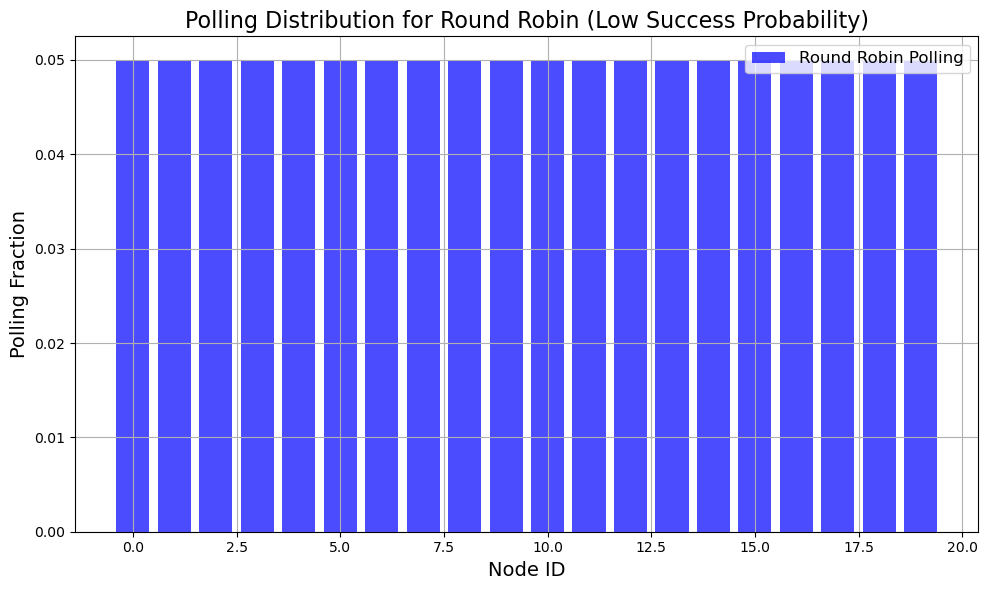

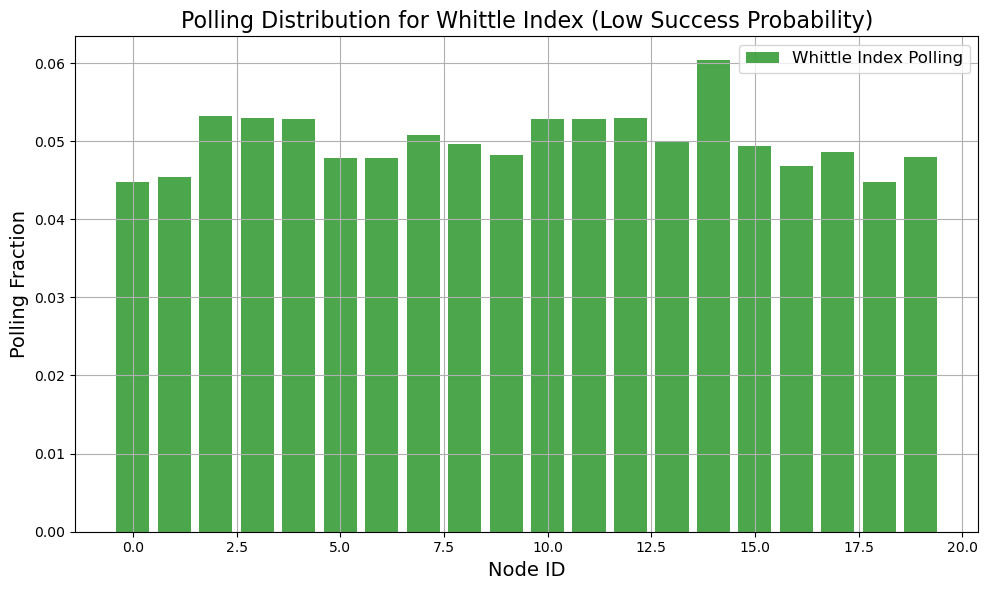

In [45]:
import numpy as np
import matplotlib.pyplot as plt

# Simulation settings
np.random.seed(42)  # Seed for reproducibility
num_nodes = 20  # Number of nodes
num_time_steps = 5000  # Number of time steps in the simulation
penalty = 0  # Penalty for polling

# Transmission success probabilities
low_success_probs = np.full(num_nodes, 0.3)  # Low success probability for all nodes

# Function to simulate Whittle index and Round Robin scheduling with polling distribution tracking
def run_simulation_with_polling_distribution(transmission_probs):
    aoi_rr = np.zeros(num_nodes)  # AoI for Round Robin scheduling
    aoi_whittle = np.zeros(num_nodes)  # AoI for Whittle index-based scheduling
    polling_counter_rr = np.zeros(num_nodes)  # Track number of polls for RR
    polling_counter_whittle = np.zeros(num_nodes)  # Track number of polls for Whittle Index
    
    # Initialize last update time for both scheduling methods
    last_update_rr = np.zeros(num_nodes)  # Last update time for RR
    last_update_whittle = np.zeros(num_nodes)  # Last update time for Whittle index

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps + 1):
        # Round Robin scheduling
        node_rr = (t - 1) % num_nodes  # Poll nodes in cyclic order
        polling_counter_rr[node_rr] += 1  # Count the poll
        if transmission_success(transmission_probs[node_rr]):
            last_update_rr[node_rr] = t  # Successful transmission

        # Whittle index-based scheduling: Poll node with the highest Whittle index
        whittle_indices = {}
        for node in range(num_nodes):
            delta_t_dynamic = t - last_update_whittle[node]  # Time since last update (AoI)
            current_aoi = delta_t_dynamic

            # Future AoI if passive (no transmission)
            future_aoi_passive = delta_t_dynamic + 1

            # Future AoI if active (transmission succeeds or fails)
            future_aoi_active = 0 if transmission_success(transmission_probs[node]) else future_aoi_passive

            # Whittle index: (q_passive - q_active)
            q_passive = current_aoi + future_aoi_passive
            q_active = current_aoi + future_aoi_active + penalty
            whittle_indices[node] = q_passive - q_active

        # Poll nodes with Whittle index > 0
        nodes_to_poll = [node for node, index in whittle_indices.items() if index > 0]
        if nodes_to_poll:
            node_whittle = nodes_to_poll[np.argmax([whittle_indices[node] for node in nodes_to_poll])]  # Choose the one with the highest index
        else:
            node_whittle = np.argmax(aoi_whittle)  # Fallback: highest AoI

        polling_counter_whittle[node_whittle] += 1  # Count the poll
        # Update Whittle index-based AoI
        if transmission_success(transmission_probs[node_whittle]):
            last_update_whittle[node_whittle] = t  # Successful transmission

    return polling_counter_rr, polling_counter_whittle

# Run the simulation for low success probability
polling_counter_rr_low, polling_counter_whittle_low = run_simulation_with_polling_distribution(low_success_probs)

# Calculate polling distribution
total_polls_rr_low = np.sum(polling_counter_rr_low)
total_polls_whittle_low = np.sum(polling_counter_whittle_low)
polling_distribution_rr_low = polling_counter_rr_low / total_polls_rr_low
polling_distribution_whittle_low = polling_counter_whittle_low / total_polls_whittle_low

# Plot the polling distribution for Round Robin
plt.figure(figsize=(10, 6))
plt.bar(np.arange(num_nodes), polling_distribution_rr_low, color='blue', alpha=0.7, label='Round Robin Polling')
plt.xlabel('Node ID', fontsize=14)
plt.ylabel('Polling Fraction', fontsize=14)
plt.title('Polling Distribution for Round Robin (Low Success Probability)', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the polling distribution for Whittle Index
plt.figure(figsize=(10, 6))
plt.bar(np.arange(num_nodes), polling_distribution_whittle_low, color='green', alpha=0.7, label='Whittle Index Polling')
plt.xlabel('Node ID', fontsize=14)
plt.ylabel('Polling Fraction', fontsize=14)
plt.title('Polling Distribution for Whittle Index (Low Success Probability)', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()



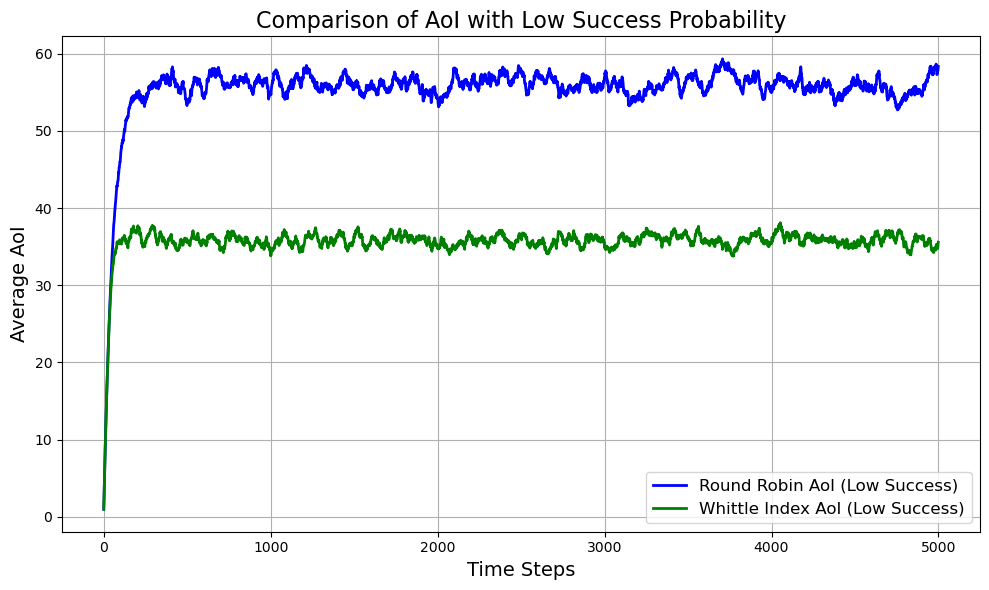

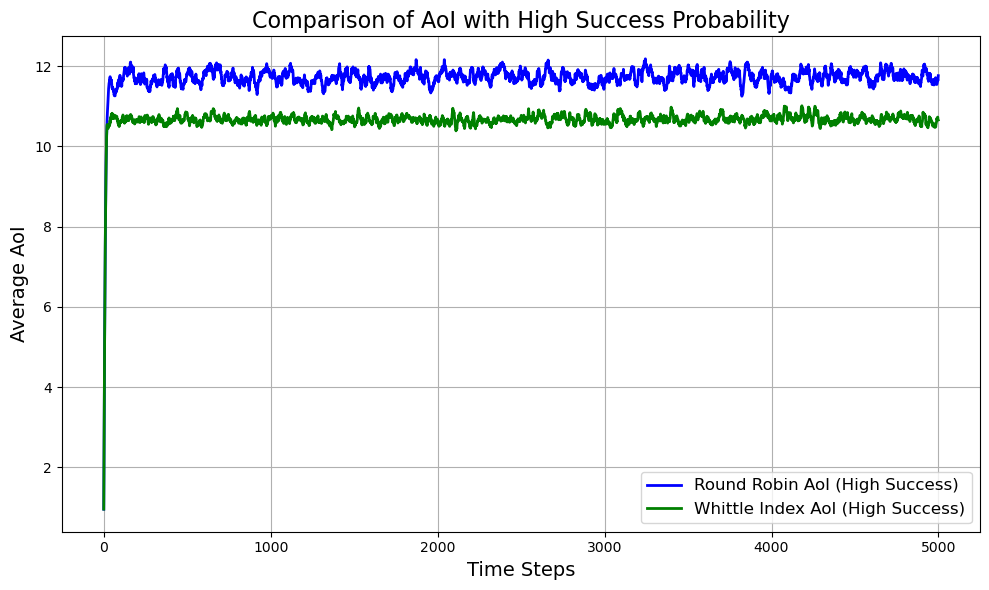

{'Final Average AoI (Low Success) - Round Robin': 58.36,
 'Final Average AoI (Low Success) - Whittle Index': 35.580500000000015,
 'Final Average AoI (High Success) - Round Robin': 11.76,
 'Final Average AoI (High Success) - Whittle Index': 10.656000000000004}

In [51]:
import numpy as np
import matplotlib.pyplot as plt

# Simulation settings
num_nodes = 20  # Number of nodes
num_time_steps = 5000  # Number of time steps in the simulation
penalty = 0  # Penalty for polling
num_runs = 100  # Number of simulation runs to average

# Transmission success probabilities
low_success_probs = np.full(num_nodes, 0.3)  # Low success probability for all nodes
high_success_probs = np.full(num_nodes, 0.9)  # High success probability for all nodes

# Function to simulate Whittle index and Round Robin scheduling
def run_simulation_with_whittle(transmission_probs):
    aoi_rr = np.zeros(num_nodes)  # AoI for Round Robin scheduling
    aoi_whittle = np.zeros(num_nodes)  # AoI for Whittle index-based scheduling
    total_aoi_rr = np.zeros(num_time_steps)  # To store AoI over time for Round Robin
    total_aoi_whittle = np.zeros(num_time_steps)  # To store AoI over time for Whittle Index

    # Initialize last update time for both scheduling methods
    last_update_rr = np.zeros(num_nodes)  # Last update time for RR
    last_update_whittle = np.zeros(num_nodes)  # Last update time for Whittle index

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps + 1):
        # Round Robin scheduling
        node_rr = (t - 1) % num_nodes  # Poll nodes in cyclic order
        if transmission_success(transmission_probs[node_rr]):
            last_update_rr[node_rr] = t  # Successful transmission
        aoi_rr = t - last_update_rr  # Update AoI for RR
        total_aoi_rr[t - 1] = np.mean(aoi_rr)  # Store average AoI for RR

        # Whittle index-based scheduling: Poll node with the highest Whittle index
        whittle_indices = {}
        for node in range(num_nodes):
            delta_t_dynamic = t - last_update_whittle[node]  # Time since last update (AoI)
            current_aoi = delta_t_dynamic

            # Future AoI if passive (no transmission)
            future_aoi_passive = delta_t_dynamic + 1

            # Future AoI if active (transmission succeeds or fails)
            future_aoi_active = 0 if transmission_success(transmission_probs[node]) else future_aoi_passive

            # Whittle index: (q_passive - q_active)
            q_passive = current_aoi + future_aoi_passive
            q_active = current_aoi + future_aoi_active + penalty
            whittle_indices[node] = q_passive - q_active

        # Poll nodes with Whittle index > 0
        nodes_to_poll = [node for node, index in whittle_indices.items() if index > 0]
        if nodes_to_poll:
            node_whittle = nodes_to_poll[np.argmax([whittle_indices[node] for node in nodes_to_poll])]  # Choose the one with the highest index
        else:
            node_whittle = np.argmax(aoi_whittle)  # Fallback: highest AoI

        # Update Whittle index-based AoI
        if transmission_success(transmission_probs[node_whittle]):
            last_update_whittle[node_whittle] = t  # Successful transmission
        aoi_whittle = t - last_update_whittle  # Update AoI for Whittle-based scheduling
        total_aoi_whittle[t - 1] = np.mean(aoi_whittle)  # Store average AoI for Whittle-based scheduling

    # Return the final average AoI at the last time step
    final_avg_aoi_rr = np.mean(aoi_rr)  # Final average AoI for Round Robin
    final_avg_aoi_whittle = np.mean(aoi_whittle)  # Final average AoI for Whittle Index
    return total_aoi_rr, total_aoi_whittle, final_avg_aoi_rr, final_avg_aoi_whittle

# Function to run multiple simulations and average the results
def run_multiple_simulations(transmission_probs, num_runs):
    avg_aoi_rr_runs = np.zeros(num_time_steps)
    avg_aoi_whittle_runs = np.zeros(num_time_steps)
    avg_final_aoi_rr = 0
    avg_final_aoi_whittle = 0

    for _ in range(num_runs):
        total_aoi_rr, total_aoi_whittle, final_avg_aoi_rr, final_avg_aoi_whittle = run_simulation_with_whittle(transmission_probs)
        avg_aoi_rr_runs += total_aoi_rr
        avg_aoi_whittle_runs += total_aoi_whittle
        avg_final_aoi_rr += final_avg_aoi_rr
        avg_final_aoi_whittle += final_avg_aoi_whittle

    # Take the average across all runs
    avg_aoi_rr_runs /= num_runs
    avg_aoi_whittle_runs /= num_runs
    avg_final_aoi_rr /= num_runs
    avg_final_aoi_whittle /= num_runs

    return avg_aoi_rr_runs, avg_aoi_whittle_runs, avg_final_aoi_rr, avg_final_aoi_whittle

# Run the multiple simulations for low success probability
avg_aoi_rr_low, avg_aoi_whittle_low, final_avg_aoi_rr_low, final_avg_aoi_whittle_low = run_multiple_simulations(low_success_probs, num_runs)

# Run the multiple simulations for high success probability
avg_aoi_rr_high, avg_aoi_whittle_high, final_avg_aoi_rr_high, final_avg_aoi_whittle_high = run_multiple_simulations(high_success_probs, num_runs)

# Plot the results for low success probability
plt.figure(figsize=(10, 6))
plt.plot(avg_aoi_rr_low, label='Round Robin AoI (Low Success)', color='blue', linewidth=2)
plt.plot(avg_aoi_whittle_low, label='Whittle Index AoI (Low Success)', color='green', linewidth=2)
plt.xlabel('Time Steps', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Comparison of AoI with Low Success Probability', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the results for high success probability
plt.figure(figsize=(10, 6))
plt.plot(avg_aoi_rr_high, label='Round Robin AoI (High Success)', color='blue', linewidth=2)
plt.plot(avg_aoi_whittle_high, label='Whittle Index AoI (High Success)', color='green', linewidth=2)
plt.xlabel('Time Steps', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Comparison of AoI with High Success Probability', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Return final average AoI values for both policies under both success probabilities
{
    "Final Average AoI (Low Success) - Round Robin": final_avg_aoi_rr_low,
    "Final Average AoI (Low Success) - Whittle Index": final_avg_aoi_whittle_low,
    "Final Average AoI (High Success) - Round Robin": final_avg_aoi_rr_high,
    "Final Average AoI (High Success) - Whittle Index": final_avg_aoi_whittle_high
}


Running simulation for 5 nodes...
Running simulation for 10 nodes...
Running simulation for 15 nodes...
Running simulation for 20 nodes...
Running simulation for 25 nodes...
Running simulation for 30 nodes...
Running simulation for 35 nodes...
Running simulation for 40 nodes...
Running simulation for 45 nodes...
Running simulation for 50 nodes...
Running simulation for 5 nodes...
Running simulation for 10 nodes...
Running simulation for 15 nodes...
Running simulation for 20 nodes...
Running simulation for 25 nodes...
Running simulation for 30 nodes...
Running simulation for 35 nodes...
Running simulation for 40 nodes...
Running simulation for 45 nodes...
Running simulation for 50 nodes...


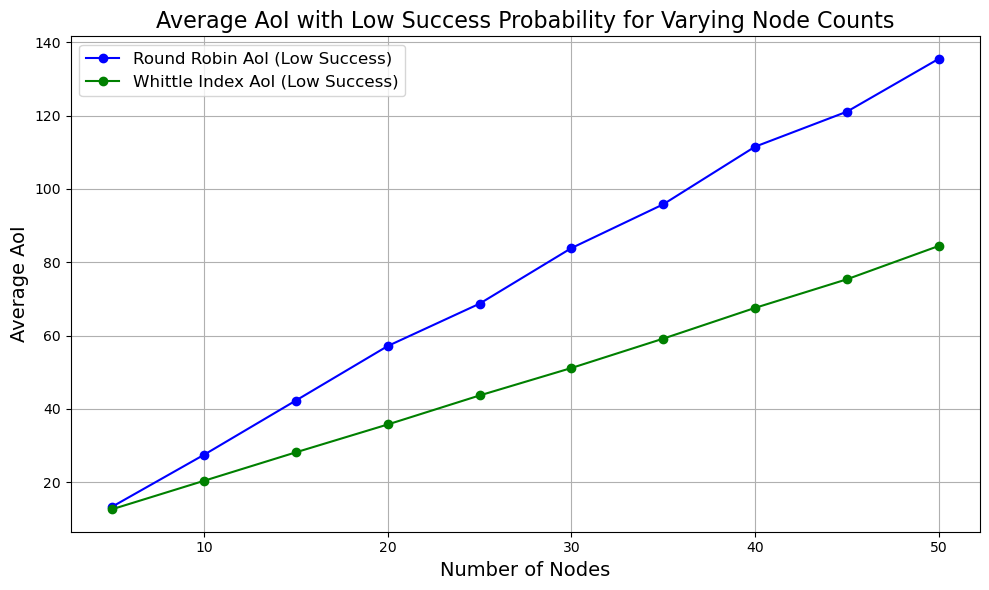

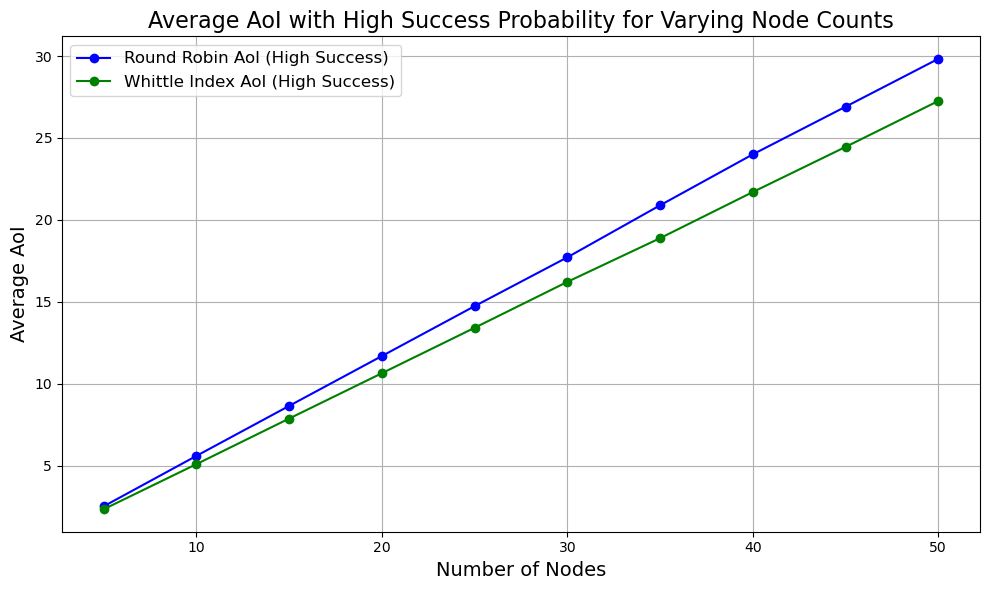

In [91]:
import numpy as np
import matplotlib.pyplot as plt

# Simulation settings
num_time_steps = 5000  # Number of time steps in the simulation
penalty = 0  # Penalty for polling
num_runs = 10 # Number of simulation runs to average

# Transmission success probabilities
low_success_prob = 0.3  # Low success probability for all nodes
high_success_prob = 0.9  # High success probability for all nodes

# Function to simulate Whittle index and Round Robin scheduling
def run_simulation_with_whittle(transmission_probs, num_nodes):
    aoi_rr = np.zeros(num_nodes)  # AoI for Round Robin scheduling
    aoi_whittle = np.zeros(num_nodes)  # AoI for Whittle index-based scheduling
    total_aoi_rr = np.zeros(num_time_steps)  # To store AoI over time for Round Robin
    total_aoi_whittle = np.zeros(num_time_steps)  # To store AoI over time for Whittle Index

    # Initialize last update time for both scheduling methods
    last_update_rr = np.zeros(num_nodes)  # Last update time for RR
    last_update_whittle = np.zeros(num_nodes)  # Last update time for Whittle index

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps + 1):
        # Round Robin scheduling
        node_rr = (t - 1) % num_nodes  # Poll nodes in cyclic order
        if transmission_success(transmission_probs[node_rr]):
            last_update_rr[node_rr] = t  # Successful transmission
        aoi_rr = t - last_update_rr  # Update AoI for RR
        total_aoi_rr[t - 1] = np.mean(aoi_rr)  # Store average AoI for RR

        # Whittle index-based scheduling: Poll node with the highest Whittle index
        whittle_indices = {}
        for node in range(num_nodes):
            delta_t_dynamic = t - last_update_whittle[node]  # Time since last update (AoI)
            current_aoi = delta_t_dynamic

            # Future AoI if passive (no transmission)
            future_aoi_passive = delta_t_dynamic + 1

            # Future AoI if active (transmission succeeds or fails)
            future_aoi_active = 0 if transmission_success(transmission_probs[node]) else future_aoi_passive

            # Whittle index: (q_passive - q_active)
            q_passive = current_aoi + future_aoi_passive
            q_active = current_aoi + future_aoi_active + penalty
            whittle_indices[node] = q_passive - q_active

        # Poll nodes with Whittle index > 0
        nodes_to_poll = [node for node, index in whittle_indices.items() if index >= 0]
        if nodes_to_poll:
            node_whittle = nodes_to_poll[np.argmax([whittle_indices[node] for node in nodes_to_poll])]  # Choose the one with the highest index
        else:
            node_whittle = np.argmax(aoi_whittle)  # Fallback: highest AoI

        # Update Whittle index-based AoI
        if transmission_success(transmission_probs[node_whittle]):
            last_update_whittle[node_whittle] = t  # Successful transmission
        aoi_whittle = t - last_update_whittle  # Update AoI for Whittle-based scheduling
        total_aoi_whittle[t - 1] = np.mean(aoi_whittle)  # Store average AoI for Whittle-based scheduling

    return total_aoi_rr, total_aoi_whittle

# Function to run multiple simulations and average the results for a specific number of nodes
def run_multiple_simulations(transmission_prob, num_nodes, num_runs):
    avg_aoi_rr_runs = np.zeros(num_time_steps)
    avg_aoi_whittle_runs = np.zeros(num_time_steps)

    for _ in range(num_runs):
        total_aoi_rr, total_aoi_whittle = run_simulation_with_whittle(transmission_prob, num_nodes)
        avg_aoi_rr_runs += total_aoi_rr
        avg_aoi_whittle_runs += total_aoi_whittle

    # Take the average across all runs
    avg_aoi_rr_runs /= num_runs
    avg_aoi_whittle_runs /= num_runs

    return avg_aoi_rr_runs, avg_aoi_whittle_runs

# Function to run the simulation for varying number of nodes
def run_simulation_for_varying_nodes(node_count_list, success_prob, num_runs):
    results_rr = []
    results_whittle = []

    for num_nodes in node_count_list:
        print(f"Running simulation for {num_nodes} nodes...")
        transmission_probs = np.full(num_nodes, success_prob)
        avg_aoi_rr, avg_aoi_whittle = run_multiple_simulations(transmission_probs, num_nodes, num_runs)
        results_rr.append(np.mean(avg_aoi_rr))  # Store the average AoI over time for RR
        results_whittle.append(np.mean(avg_aoi_whittle))  # Store the average AoI over time for Whittle Index

    return results_rr, results_whittle

# Node count list to vary the number of nodes
node_count_list = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Run the simulation for low success probability
results_rr_low, results_whittle_low = run_simulation_for_varying_nodes(node_count_list, low_success_prob, num_runs)

# Run the simulation for high success probability
results_rr_high, results_whittle_high = run_simulation_for_varying_nodes(node_count_list, high_success_prob, num_runs)

# Plot the results for low success probability
plt.figure(figsize=(10, 6))
plt.plot(node_count_list, results_rr_low, label='Round Robin AoI (Low Success)', color='blue', marker='o')
plt.plot(node_count_list, results_whittle_low, label='Whittle Index AoI (Low Success)', color='green', marker='o')
plt.xlabel('Number of Nodes', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Average AoI with Low Success Probability for Varying Node Counts', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the results for high success probability
plt.figure(figsize=(10, 6))
plt.plot(node_count_list, results_rr_high, label='Round Robin AoI (High Success)', color='blue', marker='o')
plt.plot(node_count_list, results_whittle_high, label='Whittle Index AoI (High Success)', color='green', marker='o')
plt.xlabel('Number of Nodes', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Average AoI with High Success Probability for Varying Node Counts', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


Running simulation for 5 nodes...
Running simulation for 10 nodes...
Running simulation for 15 nodes...
Running simulation for 20 nodes...
Running simulation for 25 nodes...
Running simulation for 30 nodes...
Running simulation for 35 nodes...
Running simulation for 40 nodes...
Running simulation for 45 nodes...
Running simulation for 50 nodes...
Running simulation for 5 nodes...
Running simulation for 10 nodes...
Running simulation for 15 nodes...
Running simulation for 20 nodes...
Running simulation for 25 nodes...
Running simulation for 30 nodes...
Running simulation for 35 nodes...
Running simulation for 40 nodes...
Running simulation for 45 nodes...
Running simulation for 50 nodes...


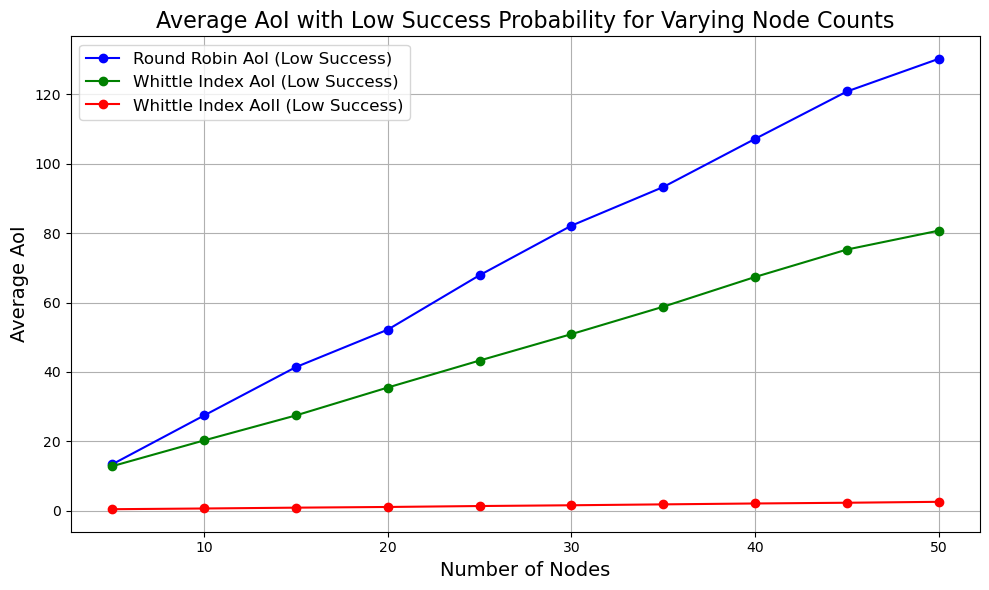

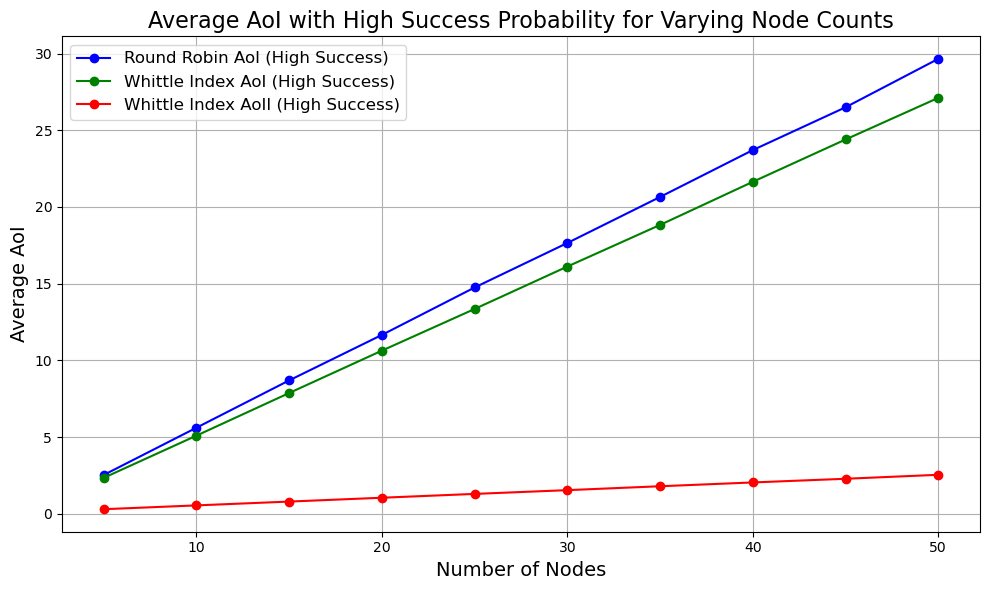

In [110]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('fifty_temperatures_motes.csv')
pivot_df = pivot_df.fillna(pivot_df.mean())  # Replace missing values with column means
pivot_df = pivot_df.head(2000)  # Limit the dataset for simulation

# Simulation settings
num_time_steps = len(pivot_df)  # Number of time steps in the simulation (based on data length)
penalty = 0  # Penalty for polling
num_runs = 10  # Number of simulation runs to average
M = 1  # Number of nodes to poll at each time step

# Function to simulate Round Robin scheduling
def run_simulation_round_robin(transmission_probs, num_nodes):
    aoi_rr = np.zeros(num_nodes)  # AoI for Round Robin scheduling
    total_aoi_rr = np.zeros(num_time_steps)  # To store AoI over time for Round Robin

    # Initialize last update time for RR
    last_update_rr = np.zeros(num_nodes)  # Last update time for RR

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps):
        node_rr = (t - 1) % num_nodes  # Poll nodes in cyclic order
        if transmission_success(transmission_probs[node_rr]):
            last_update_rr[node_rr] = t  # Successful transmission
        aoi_rr = t - last_update_rr  # Update AoI for RR
        total_aoi_rr[t - 1] = np.mean(aoi_rr)  # Store average AoI for RR

    return total_aoi_rr

# Function to simulate Whittle Index AoI
def run_simulation_whittle_aoi(transmission_probs, num_nodes):
    aoi_whittle = np.zeros(num_nodes)  # AoI for Whittle index-based scheduling
    total_aoi_whittle = np.zeros(num_time_steps)  # To store AoI over time for Whittle Index AoI

    # Initialize last update time for Whittle index
    last_update_whittle = np.zeros(num_nodes)

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Run the simulation
    for t in range(1, num_time_steps):
        whittle_indices = {}
        for node in range(num_nodes):
            delta_t_dynamic = t - last_update_whittle[node]  # Time since last update (AoI)
            current_aoi = delta_t_dynamic

            # Future AoI if passive (no transmission)
            future_aoi_passive = delta_t_dynamic + 1

            # Future AoI if active (transmission succeeds or fails)
            future_aoi_active = 0 if transmission_success(transmission_probs[node]) else future_aoi_passive

            # Whittle index: (q_passive - q_active)
            q_passive = current_aoi + future_aoi_passive
            q_active = current_aoi + future_aoi_active + penalty
            whittle_indices[node] = q_passive - q_active

        # Poll nodes with Whittle index > 0
        nodes_to_poll = [node for node, index in whittle_indices.items() if index >= 0]
        if nodes_to_poll:
            node_whittle = max(nodes_to_poll, key=lambda node: whittle_indices[node])  # Choose node with the highest index
        else:
            #node_whittle = np.argmax(aoi_whittle)  # Fallback: highest AoI
            pass

        if transmission_success(transmission_probs[node_whittle]):
            last_update_whittle[node_whittle] = t  # Successful transmission
        aoi_whittle = t - last_update_whittle  # Update AoI for Whittle-based scheduling
        total_aoi_whittle[t - 1] = np.mean(aoi_whittle)  # Store average AoI for Whittle Index AoI

    return total_aoi_whittle

# Function to simulate Whittle AoII
def run_simulation_whittle_aoii(pivot_df, transmission_probs, num_nodes):
    aoi_whittle = np.zeros(num_nodes)  # AoII for Whittle index-based scheduling
    total_aoi_whittle = np.zeros(num_time_steps)  # To store AoII over time for Whittle Index AoII

    # Initialize last update time for Whittle index
    last_update_whittle = np.zeros(num_nodes)

    state_node = {f'mote{i}': np.array([pivot_df.iloc[0, i-1], 0.1]) for i in range(1, num_nodes + 1)}  # Initialize node states
    state_sink = {f'mote{i}': np.array([pivot_df.iloc[0, i-1], 0.1]) for i in range(1, num_nodes + 1)}  # Initialize sink states

    # Function to simulate transmission success based on probability
    def transmission_success(prob):
        return np.random.rand() < prob

    # Function to update state using sensor data and transmission success
    def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1, beta_1=0.3, beta_2=0.1):
        x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
        x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
        return x1, x2

    # Run the simulation
    for t in range(1, num_time_steps):
        whittle_indices = {}
        for node in range(1, num_nodes + 1):
            delta_t_dynamic = t - last_update_whittle[node - 1]  # Time since last update

            # Calculate the current AoII based on the rate of change of information (drift)
            current_aoii = abs(state_sink[f'mote{node}'][1] * delta_t_dynamic)
            future_aoii_passive = abs(state_sink[f'mote{node}'][1] * (delta_t_dynamic + 1))
            future_aoii_active = 0 if transmission_success(transmission_probs[node - 1]) else future_aoii_passive

            # Whittle index: compare passive and active AoII penalties
            q_passive = current_aoii + future_aoii_passive
            q_active = current_aoii + future_aoii_active + penalty
            whittle_indices[node] = q_passive - q_active

        # Poll nodes with Whittle index > 0
        nodes_to_poll = [node for node, index in whittle_indices.items() if index > 0]
        if nodes_to_poll:
            node_whittle = max(nodes_to_poll, key=lambda node: whittle_indices[node])  # Choose node with the highest index
        else:
            node_whittle = np.argmax(aoi_whittle) + 1  # Fallback: poll node with the highest AoII

        # Update Whittle index-based AoII
        measured_value = pivot_df.iloc[t, node_whittle - 1]  # Actual sensor reading for the node
        last_state_value, last_rate_of_change = state_node[f'mote{node_whittle}']
        state_node[f'mote{node_whittle}'] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change)

        last_update_whittle[node_whittle - 1] = t  # Update last update time
        aoi_whittle = current_aoii  # Update AoII for Whittle-based scheduling based on current AoII
        total_aoi_whittle[t - 1] = np.mean(aoi_whittle)  # Store average AoII for Whittle Index AoII

    return total_aoi_whittle



# Function to run multiple simulations and average the results for all three comparisons
def run_multiple_simulations(pivot_df, transmission_prob, num_nodes, num_runs):
    avg_aoi_rr_runs = np.zeros(num_time_steps)
    avg_aoi_whittle_aoi_runs = np.zeros(num_time_steps)
    avg_aoi_whittle_aoii_runs = np.zeros(num_time_steps)

    for _ in range(num_runs):
        total_aoi_rr = run_simulation_round_robin(transmission_prob, num_nodes)
        total_aoi_whittle_aoi = run_simulation_whittle_aoi(transmission_prob, num_nodes)
        total_aoi_whittle_aoii = run_simulation_whittle_aoii(pivot_df, transmission_prob, num_nodes)
        
        avg_aoi_rr_runs += total_aoi_rr
        avg_aoi_whittle_aoi_runs += total_aoi_whittle_aoi
        avg_aoi_whittle_aoii_runs += total_aoi_whittle_aoii

    # Take the average across all runs
    avg_aoi_rr_runs /= num_runs
    avg_aoi_whittle_aoi_runs /= num_runs
    avg_aoi_whittle_aoii_runs /= num_runs

    return avg_aoi_rr_runs, avg_aoi_whittle_aoi_runs, avg_aoi_whittle_aoii_runs

# Function to run the simulation for varying number of nodes
def run_simulation_for_varying_nodes(pivot_df, node_count_list, transmission_prob, num_runs):
    results_rr = []
    results_whittle_aoi = []
    results_whittle_aoii = []

    for num_nodes in node_count_list:
        print(f"Running simulation for {num_nodes} nodes...")
        transmission_probs = np.full(num_nodes, transmission_prob)
        avg_aoi_rr, avg_aoi_whittle_aoi, avg_aoi_whittle_aoii = run_multiple_simulations(pivot_df, transmission_probs, num_nodes, num_runs)
        results_rr.append(np.mean(avg_aoi_rr))  # Store the average AoI over time for RR
        results_whittle_aoi.append(np.mean(avg_aoi_whittle_aoi))  # Store the average AoI over time for Whittle AoI
        results_whittle_aoii.append(np.mean(avg_aoi_whittle_aoii))  # Store the average AoI over time for Whittle AoII

    return results_rr, results_whittle_aoi, results_whittle_aoii

# Node count list to vary the number of nodes
node_count_list = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Run the simulation for low success probability
results_rr_low, results_whittle_aoi_low, results_whittle_aoii_low = run_simulation_for_varying_nodes(pivot_df, node_count_list, 0.3, num_runs)

# Run the simulation for high success probability
results_rr_high, results_whittle_aoi_high, results_whittle_aoii_high = run_simulation_for_varying_nodes(pivot_df, node_count_list, 0.9, num_runs)

# Plot the results for low success probability
plt.figure(figsize=(10, 6))
plt.plot(node_count_list, results_rr_low, label='Round Robin AoI (Low Success)', color='blue', marker='o')
plt.plot(node_count_list, results_whittle_aoi_low, label='Whittle Index AoI (Low Success)', color='green', marker='o')
plt.plot(node_count_list, results_whittle_aoii_low, label='Whittle Index AoII (Low Success)', color='red', marker='o')
plt.xlabel('Number of Nodes', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Average AoI with Low Success Probability for Varying Node Counts', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the results for high success probability
plt.figure(figsize=(10, 6))
plt.plot(node_count_list, results_rr_high, label='Round Robin AoI (High Success)', color='blue', marker='o')
plt.plot(node_count_list, results_whittle_aoi_high, label='Whittle Index AoI (High Success)', color='green', marker='o')
plt.plot(node_count_list, results_whittle_aoii_high, label='Whittle Index AoII (High Success)', color='red', marker='o')
plt.xlabel('Number of Nodes', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.title('Average AoI with High Success Probability for Varying Node Counts', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


         


# Round Robin 

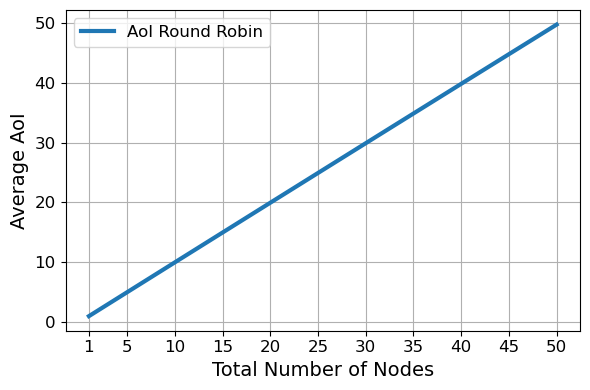

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('fifty_temperatures_motes.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
node_count_list = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]  # Different numbers of nodes
M = 1  # Fixed number of nodes to poll

# Function to initialize the state of nodes and time trackers
def initialize_states(num_nodes):
    state_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}  # Node-side state
    last_update_times = {i: 0 for i in range(1, num_nodes + 1)}  # Track last update times (AoI)
    aoi_history = {i: [] for i in range(1, num_nodes + 1)}  # Store AoI values
    return state_node, last_update_times, aoi_history

# Round Robin polling function
def run_simulation_round_robin(node_count_list, M):
    """Run the round robin polling simulation for varying node counts and return average AoI."""
    average_aoi_results = []

    for num_nodes in node_count_list:
        # Initialize states and trackers
        state_node, last_update_times, aoi_history = initialize_states(num_nodes)
        round_robin_queue = list(range(1, num_nodes + 1))  # Create a round-robin queue for the nodes

        # Run simulation for the given number of nodes
        for t in range(len(pivot_df)):
            # Poll nodes in round-robin fashion
            for _ in range(M):
                # Get the next node to poll
                mote = round_robin_queue.pop(0)
                round_robin_queue.append(mote)  # Add it back to the end of the queue

                column_name = f'mote{mote}'
                measured_value = pivot_df.loc[t, column_name]
                last_state_value, last_rate_of_change = state_node[column_name]
                delta_t_dynamic = t - last_update_times[mote]  # Time since last update (AoI)

                # Update AoI (time since last update)
                aoi_history[mote].append(delta_t_dynamic)

                # Update state
                state_node[column_name] = np.array([measured_value, last_rate_of_change])  # Dummy update
                last_update_times[mote] = t  # Update the last update time

        # Calculate the average AoI for the nodes
        aoi_times = [np.mean(history) for history in aoi_history.values() if history]
        avg_aoi = np.mean(aoi_times) if aoi_times else 0.0
        average_aoi_results.append(avg_aoi)

    return average_aoi_results

# Run the Round Robin simulation for varying node counts
average_aoi_results_round_robin = run_simulation_round_robin(node_count_list, M=1)

# Plot the Round Robin results
plt.figure(figsize=(6, 4))
plt.plot(node_count_list, average_aoi_results_round_robin, label='AoI Round Robin', linewidth=3)

# Customize plot
plt.xlabel('Total Number of Nodes', fontsize=14)
plt.ylabel('Average AoI', fontsize=14)
plt.xticks(ticks=node_count_list, labels=node_count_list, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


# Varying number of polled nodes

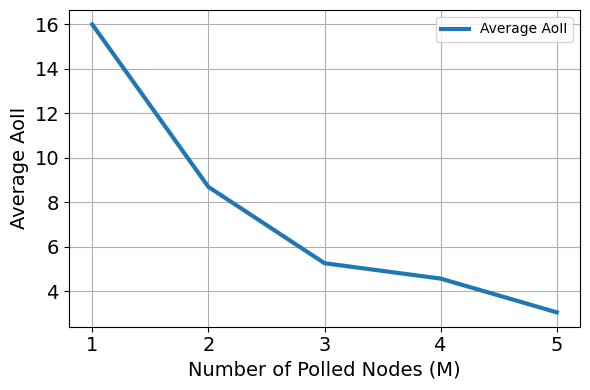

In [5]:

# Load the pivot table containing node data (e.g., sensor readings)
pivot_df = pd.read_csv('top_fifty_motes_temperatures.csv')
pivot_df = pivot_df.apply(lambda x: x.fillna(x.mean()), axis=0)
pivot_df = pivot_df.head(5000)

# Parameters
num_nodes = 50  # Number of nodes

penalty = 0.01 # Penalty for active action
gamma = 1  # Discount factor for future AoII
pdr = 1  # Probability of successful transmission
beta_1 = 0.1  # dEWMA parameter for state value
beta_2 = 0.1  # dEWMA parameter for rate of change
num_nodes_to_poll_list = [1, 2,3,4,5]  # List of different M values

# Initialize state vector (value and rate of change) for each node at the node-side using dEWMA
state_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}  # State value, Rate of change

# Initialize state vector (value and rate of change) for each node at the sink-side
state_sink = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}

# Track the last update time for each node
last_update_times = {i: 0 for i in range(1, num_nodes + 1)}

# Polling counter to track how many times each node was polled
polling_counter = {i: 0 for i in range(1, num_nodes + 1)}

# AoII tracking (to store the time spent after passive becomes worse than active)
aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Track time since threshold exceeded
aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Store AoII values for each node

# Function to update state using dEWMA filtering
def update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t):
    x1 = beta_1 * measured_value + (1 - beta_1) * (last_state_value + last_rate_of_change * delta_t)
    x2 = beta_2 * (x1 - last_state_value) / delta_t + (1 - beta_2) * last_rate_of_change
    return x1, x2

# Function to predict the AoII for the node at the sink based on the time elapsed since the last successful update
def predict_node_aoii_from_sink(state, delta_t_dynamic):
    # Calculate AoII based on the rate of change and elapsed time since the last update
    aoii = state[1] * delta_t_dynamic
    return abs(aoii)
# Poll nodes using the Whittle index
def poll_nodes_whittle(pivot_df, current_time, state_node, state_sink, actual_values, predicted_values, M, penalty, last_update_times, aoii_time_tracker, aoii_history):
    whittle_arms = {}  # Store the Whittle index for each node
    current_time_step = current_time
    nodes_to_poll = []  # Initialize nodes_to_poll

    # Predict AoII for each node at the sink and check whether to poll
    for mote in range(1, num_nodes + 1):
        column_name = f'mote{mote}'
        last_update_time = last_update_times[mote]
        delta_t_dynamic = current_time_step - last_update_time  # Dynamic delta_t since last update

        # Predict the AoII based on time elapsed since the last update
        current_aoii = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic)

        # Future AoII if no polling (passive action)
        future_aoii_passive = predict_node_aoii_from_sink(state_sink[column_name], delta_t_dynamic + 1)

        # Future AoII if polled (active action)
        future_aoii_active = 0 if np.random.rand() < pdr else future_aoii_passive

        # Calculate Whittle Index: passive action minus active action
        q_passive = current_aoii + gamma * future_aoii_passive
        q_active = current_aoii + gamma * future_aoii_active + penalty

        whittle_arms[mote] = q_passive - q_active

    # Select nodes where the Whittle index is greater than zero
    nodes_to_poll = [mote for mote in whittle_arms if whittle_arms[mote] >= 0]
    
    # Select the top M nodes with the highest Whittle index
    if len(nodes_to_poll) > M:
        nodes_to_poll = sorted(nodes_to_poll, key=whittle_arms.get, reverse=True)[:M]

    # Track AoII for nodes not polled and reset AoII for polled nodes
    for mote in range(1, num_nodes + 1):
        if whittle_arms[mote] >= 0 and mote not in nodes_to_poll:
            # Increment AoII time since threshold is exceeded but the node is not polled
            aoii_time_tracker[mote] += 1
        else:
            # Store the current AoII in history and reset tracker
            aoii_history[mote].append(aoii_time_tracker[mote])
            aoii_time_tracker[mote] = 0  # Reset AoII tracker after node is polled

    # Polling and update state
    for mote in nodes_to_poll:
        column_name = f'mote{mote}'
        measured_value = pivot_df.loc[current_time, column_name]

        # Update the state using dEWMA filtering
        last_state_value, last_rate_of_change = state_node[column_name]
        state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

        # Update the sink's state based on the node's transmitted state
        state_sink[column_name] = state_node[column_name]

        # Update the last polling time
        last_update_times[mote] = current_time

        # Store the actual and predicted values
        actual_values[mote].append(measured_value)
        predicted_values[mote].append(state_sink[column_name][0])  # Store the predicted value (state)

    return state_node, state_sink, actual_values, predicted_values, last_update_times, aoii_time_tracker, aoii_history

# Function to run the simulation for different values of M
def run_simulation_for_different_M(num_nodes_to_poll_list):
    average_aoii_results = []

    for M in num_nodes_to_poll_list:
        # Initialize variables locally within the loop
        aoii_time_tracker = {i: 0 for i in range(1, num_nodes + 1)}  # Reset AoII time tracker
        aoii_history = {i: [] for i in range(1, num_nodes + 1)}  # Reset AoII history
        state_node = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}
        state_sink = {f'mote{i}': np.array([20.0, 0.1]) for i in range(1, num_nodes + 1)}
        last_update_times = {i: 0 for i in range(1, num_nodes + 1)}  # Reset update times

        # Initialize actual and predicted value storage
        actual_values = {i: [] for i in range(1, num_nodes + 1)}
        predicted_values = {i: [] for i in range(1, num_nodes + 1)}

        # Run the simulation
        for t in range(len(pivot_df)):
            # For each time step, every node updates its state using dEWMA filter with new measurements
            for mote in range(1, num_nodes + 1):
                column_name = f'mote{mote}'
                measured_value = pivot_df.loc[t, column_name]
                last_state_value, last_rate_of_change = state_node[column_name]
                state_node[column_name] = update_node_state_dewma(measured_value, last_state_value, last_rate_of_change, delta_t=1)

            # Poll nodes based on Whittle index and AoII
            state_node, state_sink, actual_values, predicted_values, last_update_times, aoii_time_tracker, aoii_history = poll_nodes_whittle(
                pivot_df, t, state_node, state_sink, actual_values, predicted_values, M, penalty, last_update_times, aoii_time_tracker, aoii_history
            )

        # Calculate the average AoII across all nodes
        aoii_times = [np.mean(history) for history in aoii_history.values() if history]  # Exclude empty histories
        average_aoii_time = np.mean(aoii_times) if aoii_times else 0.0
        average_aoii_results.append(average_aoii_time)

    return average_aoii_results

# Run simulation for different M values
average_aoii_results = run_simulation_for_different_M(num_nodes_to_poll_list)

# Plot the results
plt.figure(figsize=(6, 4))
plt.plot(num_nodes_to_poll_list, average_aoii_results, label='Average AoII', linewidth=3)

# Customize x and y labels with plain font settings
plt.xlabel('Number of Polled Nodes (M)', fontsize=14)
plt.ylabel('Average AoII', fontsize=14)

# Set x-ticks to be the same as the integer values from num_nodes_to_poll_list
plt.xticks(ticks=num_nodes_to_poll_list, labels=num_nodes_to_poll_list, fontsize=14)

# Customize y-ticks
plt.yticks(fontsize=14)

# Display legend
plt.legend()

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()